# **Maestría en Inteligencia Artificial Aplicada**

## Curso: **Proyecto Integrador**

### Tecnológico de Monterrey

## Actividad Semana 5

### **Actividad 3. Baseline**

Nombres y matrículas de los integrantes del equipo:
* Adrián Alejandro Dávila González - A01039334
* Samuel Emanuel Aguilar García - A00816565

## **Actividades Iniciales**

### **Descripción de Contexto**

El propósito de este Proyecto Integrador, como se ha mencionado en las descripciones de semanas anteriores, consiste en desarrollar un programa que permita detectar si un componente físico de un sistema de rectificación eléctrica se está comportando de manera correcta o incorrecta en base a mediciones de temperatura capturadas por una cámara térmica durante la operación del equipo.

Para llevar a cabo esto, se tiene considerado hacer uso de dos tipos de modelos de aprendizaje:
*   **Modelo de Aprendizaje Profundo, específicamente un modelo de visión computacional.**
*   **Modelo de Aprendizaje No Supervisado, específicamente un modelo de agrupamiento.**

El uso de las técnicas mencionadas es debido a que se busca realizar la detección de componentes de interés en las imágenes capturadas por el equipo de medición, por lo cual se tiene en cuenta el modelo de visión, y la detección de anomalías en base al comportamiento detectado gracias a las mediciones de temperatura en estos elementos, por lo cual se tiene en cuenta el modelo de agrupamiento.


Al ser un entrenamiento basado en equipo propio, creamos una base de datos de fotografías y datos utilizando una cámara termográfica. Esta cámara nos proporciona distintos tipos de imágenes (como luz normal, térmica y mixta), así como un arreglo de las temperaturas dentro de la imagen. Actualmente, contamos con 382 fotografías (cada una con sus distintos filtros y mapa de temperaturas). Esta base de datos es inicial, ya que buscamos incrementarla a lo largo del proyecto para poder obtener un modelo con mayor precisión. El procesamiento que hemos aplicado a estas variables se describirá más adelante.

### **Referencias**

*   Redmon, J., Divvala, S., Girshick, R., & Farhadi, A. (2016). You only look once: Unified, real-time object detection. IEEE Conference on Computer Vision and Pattern Recognition (CVPR).
*   Jocher, G., et al. (2022). YOLOv5: A guide to object detection. Ultralytics.
*   Roboflow Team. (2022). How to Improve your Computer Vision Model. Roboflow Blog. https://blog.roboflow.com/model-best-practices/
*   sobel — SciPy v1.14.1 Manual. (n.d.). https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.sobel.html
*   Drake, A. (2024, March 26). Unveiling the potential of histogram of Oriented gradients (HOG) in computer vision. Comet. https://www.comet.com/site/blog/unveiling-the-potential-of-histogram-of-oriented-gradients-hog-in-computer-vision/
*   Mittal, K. (2024, March 12). A gentle introduction into the histogram of oriented gradients. Medium. https://medium.com/analytics-vidhya/a-gentle-introduction-into-the-histogram-of-oriented-gradients-fdee9ed8f2aa
*   Tyagi, M. (2024, April 2). Histogram of Oriented Gradients: An Overview. Built In. https://builtin.com/articles/histogram-of-oriented-gradients
*   Effect of (not) standardizing variables in k-means clustering - Dmitrijs Kass’ blog. (2019, October 22). https://dmitrijskass.netlify.app/2019/10/22/effect-of-not-standardizing-variables-in-k-means-clustering/
*   Meritshot. (2023, August 22). Standardization v/s Normalization - Meritshot - Medium. Medium. https://medium.com/@meritshot/standardization-v-s-normalization-6f93225fbd84
*   Javali, M. (2023, May 4). 10 ways to extract features from an image - Mohit Javali - Medium. Medium. https://medium.com/@mohitjavali/10-ways-to-extract-features-from-an-image-f44c8e9b0fbf
*   Are mean normalization and feature scaling needed for k-means clustering? (n.d.). Cross Validated. https://stats.stackexchange.com/questions/21222/are-mean-normalization-and-feature-scaling-needed-for-k-means-clustering
*   Feature Detectors - Sobel Edge Detector. (n.d.). https://homepages.inf.ed.ac.uk/rbf/HIPR2/sobel.htm
*   Virmani, D., Taneja, S., & Malhotra, G. (2015, March 3). Normalization based K means Clustering Algorithm. arXiv.org. https://arxiv.org/abs/1503.00900
*   Jamshed, M., Parvin, S., & Akter, S. (2015). Significant HOG-Histogram of oriented gradient feature selection for human detection. International Journal of Computer Applications (0975 – 8887), 132(17). https://citeseerx.ist.psu.edu/document?repid=rep1&type=pdf&doi=0397e6e40e3a85177e70beae70d454dbafed2b5c
*   Jocher, G., Chubukov, P., & M, L. (2022). Ultralytics YOLOv5: State-of-the-art object detection. Retrieved from https://github.com/ultralytics/yolov5
*   Daniel. (2024, January 30). Isolation Forest: ¿cómo detectar anomalías en un conjunto de datos? Formación En Ciencia De Datos | DataScientest.com. https://datascientest.com/es/isolation-forest
*   AI & Insights. (2023, July 21). Anomaly Detection - AI & Insights - Medium. Medium. https://medium.com/@AIandInsights/anomaly-detection-86e8a1cabbc3#
*   Checking outliers with *performance*. (n.d.). https://easystats.github.io/performance/articles/check_outliers#
*   2.7. Novelty and Outlier Detection. (n.d.). Scikit-learn. https://scikit-learn.org/1.5/modules/outlier_detection.html
*   Jiang, M., Han, S., & Huang, H. (2023). Anomaly Detection with Score Distribution Discrimination. ACM. https://doi.org/10.1145/3580305.3599258
*   Bougaham, A., Adoui, M. E., Linden, I., & Frénay, B. (2023). Composite score for anomaly detection in imbalanced real-world industrial dataset. Machine Learning, 113(7), 4381–4406. https://doi.org/10.1007/s10994-023-06415-9

### **Importado de Librerías a Utilizar**

In [1]:
# Montaje de Libreta en Entorno de Google Collaboratory.
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Setting the locale to UTF-8 to avoid the NotImplementedError
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [3]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.0/871.0 kB 8.5 MB/s eta 0:00:00


In [4]:
pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118


In [5]:
# Importado de Librerías.
import os
import pandas as pd
import numpy as np
import seaborn as sns
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import sobel
from scipy.ndimage import zoom
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from ultralytics import YOLO, hub
import torch
import tensorflow as tf
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import silhouette_score

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [6]:
# Definición de Ruta en Directorios.
Main_Dir= "/content/drive/MyDrive/Maestría/Sexto Trimestre/Proyecto Integrador/Semana 5"
Temp_Dir = os.path.join(Main_Dir, "Mediciones de Temperatura")
IR_Dir = os.path.join(Main_Dir, "Filtro Infrarrojo")
PIP_Dir = os.path.join(Main_Dir, "Filtro Superpuesto")
VL_Dir = os.path.join(Main_Dir, "Luz Visible")
ImData_Dir = os.path.join(Main_Dir, "Dataset Imágenes")
RoboFlow_Dir = os.path.join(Main_Dir, "Dataset Imágenes")
os.chdir(Main_Dir)

# **Modelos de Aprendizaje Profundo**

### **Algoritmo**

Para abordar el problema de identificación de componentes en imágenes térmicas de equipos industriales, seleccionamos el modelo YOLOv8 en su versión nano (YOLOv8n), debido a varios factores clave que hacen que este algoritmo sea apropiado para el tipo de datos y la tarea en cuestión.

Primero, YOLOv8n está diseñado específicamente para la detección de objetos en imágenes no estructuradas, que es el tipo de datos con los que trabajamos en este proyecto. Las imágenes pueden llegar a ser complejas, con variaciones de color o con muchos elementos. El uso de YOLOv8 permite localizar y clasificar estos componentes con precisión, incluso cuando las imágenes no siguen patrones estructurados.

Además, YOLOv8n es una versión ligera del algoritmo, lo que lo convierte en una excelente opción para un modelo baseline. Al ser más compacto y menos demandante en términos de recursos computacionales, facilita la experimentación rápida en las primeras etapas del proyecto. Esto nos permite obtener una evaluación inicial del problema sin la necesidad de invertir en modelos más grandes o complejos, lo que también reduce el tiempo de entrenamiento y prueba. Para incrementar esta rapidez, estamos utilizando los recursos de la PC (GPU) para realizar el entrenamiento.

El tamaño del dataset es otro factor importante. Si bien contamos con una cantidad moderada de imágenes etiquetadas para entrenar el modelo, no es un conjunto de datos masivo, lo que hace que un modelo ligero como YOLOv8n sea una opción más adecuada. Modelos más grandes podrían sobreajustarse o requerir una mayor cantidad de datos para generalizar bien. En este caso, la elección de un modelo más ligero como baseline garantiza que podamos observar si los datos contienen suficiente información relevante para la tarea.

Otro aspecto relevante es la interpretabilidad del modelo. Aunque en esta fase inicial la interpretabilidad no es el principal enfoque, la arquitectura de YOLOv8 permite obtener resultados que pueden ser visualizados fácilmente. Los cuadros delimitadores sobre las imágenes permiten una interpretación directa de qué componentes han sido detectados y dónde, lo cual es crucial para poder validar el rendimiento del modelo en esta etapa temprana.

Finalmente, estamos utilizando Ultralytics para el entrenamiento y gestión de los modelos, una plataforma que proporciona una interfaz optimizada para trabajar con YOLOv8. Ultralytics facilita la carga de datos, el ajuste de hiperparámetros y la monitorización de resultados en tiempo real. Esta integración no solo mejora la eficiencia del desarrollo, sino que también permite iterar rápidamente sobre el proceso de entrenamiento, asegurando que podamos evaluar el modelo baseline de manera rápida y eficaz.

### **Características importantes**

Como se mencionó anteriormente, en el contexto de modelos de aprendizaje profundo como YOLO, el enfoque tradicional de ingeniería de características tiene una menor aplicabilidad. Dado que trabajamos con datos de entrada en forma de imágenes, estos modelos son capaces de aprender automáticamente las características relevantes directamente de las imágenes sin necesidad de intervención manual.

En lugar de aplicar técnicas de selección de características como el filtrado, el envolvimiento o la extracción, el modelo aprende de forma automática a identificar patrones y características significativas durante el proceso de entrenamiento. Esto simplifica significativamente el flujo de trabajo, eliminando la necesidad de preprocesamiento exhaustivo. Sin embargo, este enfoque también plantea desafíos, ya que la calidad de las imágenes y de sus respectivas etiquetas se vuelve crucial para el rendimiento del modelo.

Por lo tanto, la atención se debe centrar en asegurar que el conjunto de datos esté bien organizado y limpio, lo cual implica filtrar imágenes de baja calidad y garantizar un etiquetado preciso. En nuestro caso, utilizamos Roboflow para revisar y filtrar las imágenes, eliminando aquellas que no cumplían con los estándares de calidad necesarios. Esto nos permitió crear una base de datos confiable que facilita el entrenamiento del modelo, asegurando que este esté expuesto a datos relevantes y bien etiquetados.

### **Etiquetado de imágenes**

Dentro de la aplicación Roboflow, se importaron todas las imágenes que se capturaron del equipo para su etiquetado.

En esta plataforma, cada imagen fue revisada y se eliminaron aquellas que estaban borrosas o que no contenían elementos relevantes para etiquetar.

Acto siguiente se definieron los componentes, estableciendo regiones específicas para cada uno dentro de las imágenes. Además de esto, la plataforma brinda la posibilidad de etiquetar múltiples componentes de diferentes tipos en una misma imagen.

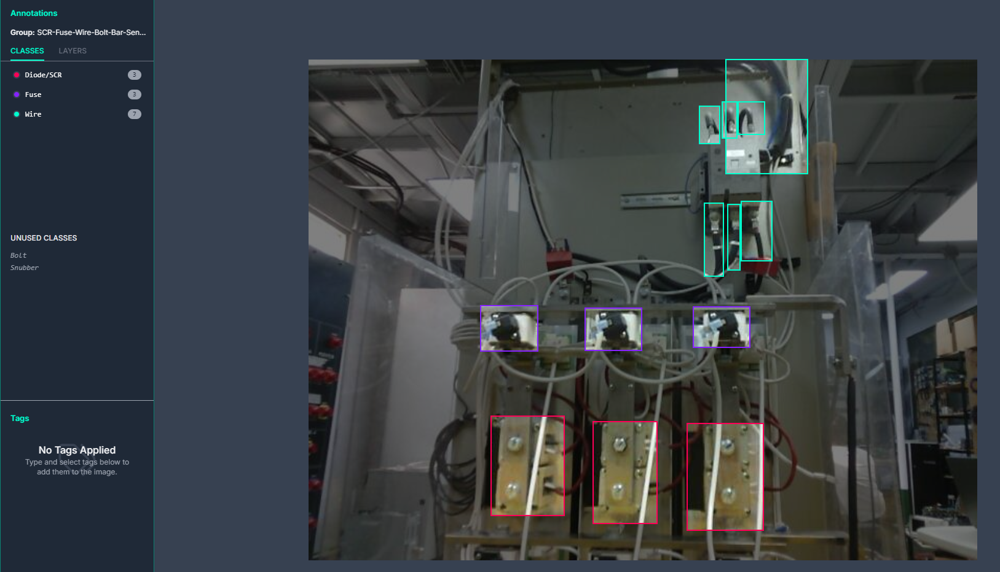

Así fue como se creó la base de datos ya etiquetada, a la cual se le buscará incrementar en tamaño para el entrenamiento y optimización de los modelos de visión a utilizar.

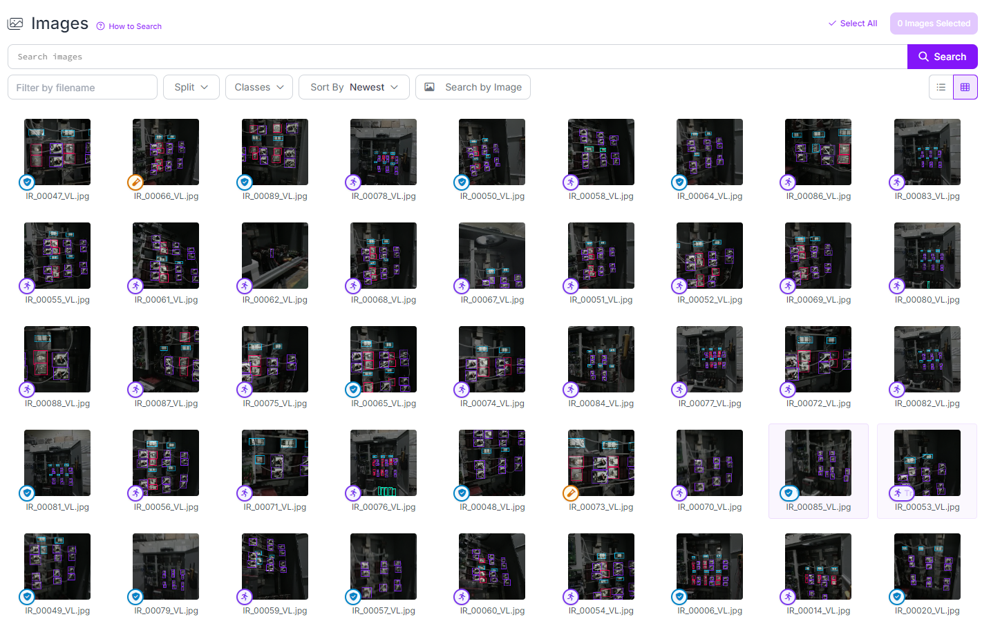

Una de las principales ventajas de esta aplicación es que prepara los datos en el formato que requieren los modelos que vamos a comparar. Este conjunto de datos incluye tanto las imágenes como las posiciones de las etiquetas en cada una de ellas.

In [7]:
# Impresión del contenido de los archivos de lectura con la información del dataset

# Nombre del archivo de texto correspondiente al archivo de RoboFlow
file_RD1 = 'README.roboflow.txt'

# Construcción de ruta hacia el archivo
file_path_RD1 = os.path.join(ImData_Dir, file_RD1)

# Apertura y lectura del archivo
with open(file_path_RD1, 'r') as file:
    content_RD1 = file.read()
    print(content_RD1)


Thermal Region and Components - v1 2024-09-30 2:08am

This dataset was exported via roboflow.com on September 30, 2024 at 2:08 AM GMT

Roboflow is an end-to-end computer vision platform that helps you
* collaborate with your team on computer vision projects
* collect & organize images
* understand and search unstructured image data
* annotate, and create datasets
* export, train, and deploy computer vision models
* use active learning to improve your dataset over time

For state of the art Computer Vision training notebooks you can use with this dataset,
visit https://github.com/roboflow/notebooks

To find over 100k other datasets and pre-trained models, visit https://universe.roboflow.com

The dataset includes 382 images.
SCR-Fuse-Wire-Bolt-Bar-Sensor are annotated in YOLOv8 format.

The following pre-processing was applied to each image:
* Auto-orientation of pixel data (with EXIF-orientation stripping)
* Resize to 640x640 (Stretch)

No image augmentation techniques were applied.




In [8]:
# Impresión del contenido de los archivos de lectura con la información del dataset

# Nombre del archivo de texto correspondiente al archivo del Dataset
file_RD2 = 'README.dataset.txt'

# Construcción de ruta hacia el archivo
file_path_RD2 = os.path.join(ImData_Dir, file_RD2)

# Apertura y lectura del archivo
with open(file_path_RD2, 'r') as file:
    content_RD2 = file.read()
    print(content_RD2)

# Thermal Region and Components > 2024-09-30 2:08am
https://universe.roboflow.com/adrians-workspace-sghcv/thermal-region-and-components

Provided by a Roboflow user
License: CC BY 4.0




### **Entrenamiento Modelo**

In [12]:
# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

# Train the model
model.train(data=os.path.join(ImData_Dir, "data.yaml"), epochs=100, imgsz=640)

Ultralytics 8.3.12 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/Maestría/Sexto Trimestre/Proyecto Integrador/Semana 5/Dataset Imágenes/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False

train: Scanning /content/drive/MyDrive/Maestría/Sexto Trimestre/Proyecto Integrador/Semana 5/Dataset Imágenes/train/labels.cache... 268 images, 0 backgrounds, 0 corrupt: 100%|██████████| 268/268 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Maestría/Sexto Trimestre/Proyecto Integrador/Semana 5/Dataset Imágenes/valid/labels.cache... 74 images, 0 backgrounds, 0 corrupt: 100%|██████████| 74/74 [00:00<?, ?it/s]


Plotting labels to runs/detect/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train5
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.75G      2.896      4.378      2.195        232        640: 100%|██████████| 17/17 [00:06<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.59it/s]

                   all         74       1162   6.75e-05    0.00218    3.7e-05   6.41e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.64G      2.354      3.739      1.626        310        640: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all         74       1162    0.00192     0.0697    0.00178   0.000452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.68G      2.266      2.942      1.437        294        640: 100%|██████████| 17/17 [00:05<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         74       1162     0.0327      0.114     0.0547     0.0186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100       2.6G      2.128      2.302      1.382        193        640: 100%|██████████| 17/17 [00:08<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all         74       1162     0.0205      0.189     0.0986     0.0364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.79G      2.083      1.847      1.361        278        640: 100%|██████████| 17/17 [00:04<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.32it/s]

                   all         74       1162     0.0297      0.323      0.188     0.0777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.88G      1.952       1.56      1.324        209        640: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.18it/s]

                   all         74       1162      0.189      0.437      0.324      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.86G      1.925      1.458      1.309        162        640: 100%|██████████| 17/17 [00:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all         74       1162      0.872      0.186      0.386      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       2.7G      1.867      1.381      1.291        252        640: 100%|██████████| 17/17 [00:06<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.22it/s]

                   all         74       1162      0.845      0.369      0.433      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.61G      1.857      1.341      1.292        197        640: 100%|██████████| 17/17 [00:05<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         74       1162      0.854      0.408      0.474      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.08G      1.821      1.266       1.25        420        640: 100%|██████████| 17/17 [00:04<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.34it/s]

                   all         74       1162      0.724      0.502      0.545      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.68G      1.783      1.223      1.225        236        640: 100%|██████████| 17/17 [00:06<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all         74       1162       0.73      0.591      0.576      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.86G      1.788       1.21      1.242        206        640: 100%|██████████| 17/17 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]

                   all         74       1162      0.767      0.601      0.595      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.13G      1.781      1.193      1.251        205        640: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.31it/s]

                   all         74       1162       0.82      0.619      0.639      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.82G      1.755      1.147      1.218        216        640: 100%|██████████| 17/17 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         74       1162      0.826      0.644      0.662      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.86G      1.713      1.127      1.214        348        640: 100%|██████████| 17/17 [00:08<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.30it/s]

                   all         74       1162      0.827       0.66      0.666      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.97G      1.732       1.11        1.2        232        640: 100%|██████████| 17/17 [00:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]

                   all         74       1162      0.829      0.607      0.642      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.88G      1.717      1.083      1.203        252        640: 100%|██████████| 17/17 [00:06<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

                   all         74       1162       0.86      0.642       0.68      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.76G      1.696      1.073      1.203        329        640: 100%|██████████| 17/17 [00:05<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]

                   all         74       1162      0.817       0.64      0.651      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.85G      1.661      1.048      1.186        300        640: 100%|██████████| 17/17 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.48it/s]

                   all         74       1162      0.841      0.654      0.675      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.06G      1.668      1.011      1.192        222        640: 100%|██████████| 17/17 [00:08<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.30it/s]

                   all         74       1162      0.831      0.655      0.661      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.59G      1.645      1.006      1.181        230        640: 100%|██████████| 17/17 [00:05<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

                   all         74       1162      0.842       0.61      0.642      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.77G      1.682      1.021      1.179        332        640: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]

                   all         74       1162      0.862      0.563       0.62      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.71G      1.663      1.004      1.178        243        640: 100%|██████████| 17/17 [00:04<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all         74       1162      0.873      0.635       0.68      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.67G      1.646     0.9939      1.179        300        640: 100%|██████████| 17/17 [00:08<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.70it/s]


                   all         74       1162      0.854      0.659      0.667      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.83G      1.631     0.9919      1.179        259        640: 100%|██████████| 17/17 [00:04<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.82it/s]

                   all         74       1162      0.823      0.689      0.679      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         3G      1.633     0.9759      1.161        228        640: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.26it/s]

                   all         74       1162      0.844      0.678      0.675      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.97G      1.626     0.9805      1.169        200        640: 100%|██████████| 17/17 [00:04<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all         74       1162      0.841      0.677      0.676      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.58G       1.61     0.9731      1.167        245        640: 100%|██████████| 17/17 [00:04<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.61it/s]

                   all         74       1162      0.867      0.661      0.689      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.64G      1.604     0.9344      1.153        383        640: 100%|██████████| 17/17 [00:06<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]


                   all         74       1162      0.884      0.655      0.685      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.65G      1.592     0.9382      1.164        337        640: 100%|██████████| 17/17 [00:04<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.21it/s]

                   all         74       1162      0.848      0.636      0.676      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.73G      1.607     0.9462      1.171        296        640: 100%|██████████| 17/17 [00:08<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]


                   all         74       1162       0.86       0.68        0.7      0.332

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.74G      1.595     0.9241      1.154        218        640: 100%|██████████| 17/17 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

                   all         74       1162      0.845      0.679      0.697      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.79G      1.589     0.9194      1.153        255        640: 100%|██████████| 17/17 [00:07<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.29it/s]

                   all         74       1162      0.904      0.636      0.692      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.76G      1.571     0.8991      1.129        258        640: 100%|██████████| 17/17 [00:04<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         74       1162      0.666      0.639      0.677      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.65G      1.584     0.9114      1.149        352        640: 100%|██████████| 17/17 [00:05<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.43it/s]

                   all         74       1162      0.664      0.675       0.68      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.75G      1.592     0.8937      1.151        300        640: 100%|██████████| 17/17 [00:05<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.96it/s]

                   all         74       1162      0.859      0.667      0.667      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.81G      1.607     0.9187      1.165        192        640: 100%|██████████| 17/17 [00:05<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.47it/s]

                   all         74       1162      0.873      0.654      0.696      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.59G      1.581     0.9296      1.157        190        640: 100%|██████████| 17/17 [00:07<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]

                   all         74       1162      0.677      0.689      0.708      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100       2.8G      1.579     0.8837       1.14        210        640: 100%|██████████| 17/17 [00:04<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         74       1162      0.659      0.685      0.707      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       2.8G      1.566     0.8881       1.16        257        640: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.86it/s]

                   all         74       1162      0.641      0.663      0.678      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.96G      1.553      0.885      1.139        281        640: 100%|██████████| 17/17 [00:04<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

                   all         74       1162      0.663      0.685      0.693      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.04G      1.554     0.8613       1.14        284        640: 100%|██████████| 17/17 [00:09<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.22it/s]

                   all         74       1162       0.65      0.707      0.688      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.68G      1.541     0.8467      1.123        244        640: 100%|██████████| 17/17 [00:04<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all         74       1162      0.655      0.681      0.686      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.73G      1.528     0.8556      1.138        231        640: 100%|██████████| 17/17 [00:05<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

                   all         74       1162       0.67      0.651      0.667      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.89G       1.55     0.8741      1.133        308        640: 100%|██████████| 17/17 [00:06<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.31it/s]

                   all         74       1162       0.66       0.66      0.665      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.59G      1.523     0.8441      1.135        266        640: 100%|██████████| 17/17 [00:05<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

                   all         74       1162      0.657      0.667      0.672      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.97G      1.554     0.8583      1.127        197        640: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all         74       1162      0.657       0.67      0.687       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.68G      1.547     0.8393      1.122        239        640: 100%|██████████| 17/17 [00:04<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.34it/s]

                   all         74       1162      0.675      0.658      0.682      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.02G      1.548     0.8745      1.149        261        640: 100%|██████████| 17/17 [00:08<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.27it/s]

                   all         74       1162      0.653      0.678      0.686      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.88G      1.549     0.8517      1.134        300        640: 100%|██████████| 17/17 [00:04<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.34it/s]


                   all         74       1162       0.65       0.65      0.663      0.312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.04G      1.539     0.8204      1.114        201        640: 100%|██████████| 17/17 [00:05<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.21it/s]

                   all         74       1162      0.645      0.689      0.669      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.74G      1.536     0.8463       1.14        250        640: 100%|██████████| 17/17 [00:05<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.82it/s]

                   all         74       1162      0.659      0.676      0.674      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.92G      1.521       0.83      1.113        279        640: 100%|██████████| 17/17 [00:04<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all         74       1162      0.655      0.685      0.679      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.95G      1.516     0.8182      1.113        238        640: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]

                   all         74       1162      0.668      0.665      0.669      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.98G      1.522      0.827      1.131        280        640: 100%|██████████| 17/17 [00:04<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.68it/s]

                   all         74       1162      0.678      0.679      0.688      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.65G      1.497     0.8046      1.112        210        640: 100%|██████████| 17/17 [00:08<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.45it/s]

                   all         74       1162      0.689      0.673        0.7      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.84G      1.491     0.8178      1.123        262        640: 100%|██████████| 17/17 [00:05<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all         74       1162      0.669        0.7       0.69      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.13G      1.512     0.8058      1.112        355        640: 100%|██████████| 17/17 [00:06<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.43it/s]

                   all         74       1162      0.712      0.669      0.697      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.08G      1.494      0.785      1.102        269        640: 100%|██████████| 17/17 [00:05<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]


                   all         74       1162      0.685      0.666      0.689      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.72G       1.48     0.7916      1.108        226        640: 100%|██████████| 17/17 [00:05<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]

                   all         74       1162      0.673      0.655      0.671      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.84G       1.48     0.7861      1.107        251        640: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all         74       1162      0.671      0.687       0.68      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100       2.8G      1.488     0.8013      1.107        316        640: 100%|██████████| 17/17 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.34it/s]

                   all         74       1162      0.676      0.699      0.685      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.04G      1.463     0.7804      1.099        266        640: 100%|██████████| 17/17 [00:07<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all         74       1162      0.664      0.691      0.681      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.02G      1.466     0.7877      1.097        227        640: 100%|██████████| 17/17 [00:06<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         74       1162      0.676      0.662      0.676      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.73G      1.485     0.7751      1.101        307        640: 100%|██████████| 17/17 [00:08<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.44it/s]

                   all         74       1162      0.685      0.679       0.69      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.65G      1.488      0.786      1.111        235        640: 100%|██████████| 17/17 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.68it/s]

                   all         74       1162       0.69      0.668      0.682      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.79G      1.465     0.7695      1.106        232        640: 100%|██████████| 17/17 [00:06<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.13it/s]

                   all         74       1162      0.686      0.667      0.686      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.74G      1.452     0.7706      1.103        252        640: 100%|██████████| 17/17 [00:07<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

                   all         74       1162      0.675      0.672      0.681      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.22G       1.47     0.7658      1.107        284        640: 100%|██████████| 17/17 [00:09<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.69it/s]


                   all         74       1162      0.678      0.683      0.693      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.61G      1.449     0.7578      1.085        280        640: 100%|██████████| 17/17 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all         74       1162      0.673      0.674      0.692      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.69G       1.43     0.7472      1.078        284        640: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all         74       1162      0.677      0.669      0.689       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.65G      1.445     0.7543      1.093        283        640: 100%|██████████| 17/17 [00:04<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         74       1162      0.699      0.661      0.684       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.82G       1.45     0.7592      1.104        345        640: 100%|██████████| 17/17 [00:06<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.28it/s]

                   all         74       1162      0.684      0.685       0.69      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.66G      1.444     0.7437      1.075        326        640: 100%|██████████| 17/17 [00:05<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]

                   all         74       1162      0.658      0.691      0.686      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.85G      1.457     0.7523      1.094        276        640: 100%|██████████| 17/17 [00:04<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all         74       1162      0.676       0.68       0.68      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.86G       1.43     0.7396      1.088        269        640: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]


                   all         74       1162      0.676      0.693      0.685      0.341

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.64G      1.457       0.75      1.086        189        640: 100%|██████████| 17/17 [00:05<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         74       1162       0.68      0.689      0.687       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100       2.9G       1.44     0.7397      1.089        232        640: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.29it/s]

                   all         74       1162      0.671      0.689       0.69      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.69G      1.411     0.7313      1.084        311        640: 100%|██████████| 17/17 [00:04<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]

                   all         74       1162      0.664      0.688       0.69      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.71G      1.404     0.7371      1.083        239        640: 100%|██████████| 17/17 [00:09<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]

                   all         74       1162      0.667      0.697      0.686      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.87G      1.403     0.7131      1.079        193        640: 100%|██████████| 17/17 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]

                   all         74       1162      0.675      0.688      0.686      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.83G      1.396     0.7196      1.082        203        640: 100%|██████████| 17/17 [00:06<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.33it/s]

                   all         74       1162      0.672      0.682      0.676      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.89G      1.397     0.7211      1.071        301        640: 100%|██████████| 17/17 [00:05<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all         74       1162      0.675        0.7      0.688      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.64G      1.389      0.717      1.072        229        640: 100%|██████████| 17/17 [00:06<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all         74       1162      0.678      0.669      0.675      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.05G      1.404     0.7275      1.091        301        640: 100%|██████████| 17/17 [00:08<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.69it/s]

                   all         74       1162      0.663      0.689       0.68      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.03G      1.418     0.7162      1.074        305        640: 100%|██████████| 17/17 [00:04<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all         74       1162      0.666      0.706      0.687      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.86G      1.411     0.7294      1.081        301        640: 100%|██████████| 17/17 [00:07<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.28it/s]

                   all         74       1162      0.675       0.69      0.686      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.83G      1.372     0.7017      1.062        241        640: 100%|██████████| 17/17 [00:04<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all         74       1162      0.659      0.676      0.678      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100       2.7G      1.415     0.7117      1.084        311        640: 100%|██████████| 17/17 [00:05<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all         74       1162       0.67      0.673      0.676      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.63G      1.373     0.7258      1.084        161        640: 100%|██████████| 17/17 [00:05<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         74       1162      0.666      0.688      0.673      0.326


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.57G      1.418     0.7157      1.122        175        640: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

                   all         74       1162      0.676      0.681      0.669       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.46G       1.41     0.7026      1.096        171        640: 100%|██████████| 17/17 [00:05<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.86it/s]

                   all         74       1162      0.685      0.687      0.684      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.47G      1.379     0.6878      1.089        191        640: 100%|██████████| 17/17 [00:04<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

                   all         74       1162      0.668      0.693      0.682      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.52G      1.366     0.6766      1.082        190        640: 100%|██████████| 17/17 [00:07<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]

                   all         74       1162      0.691      0.669      0.674      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.45G      1.349     0.6645       1.08        159        640: 100%|██████████| 17/17 [00:04<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         74       1162      0.686      0.671      0.675      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.45G      1.358     0.6691      1.072        154        640: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.42it/s]

                   all         74       1162      0.684      0.676      0.679      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       2.5G      1.354     0.6621      1.083        183        640: 100%|██████████| 17/17 [00:04<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all         74       1162      0.678      0.677       0.68      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.52G      1.334     0.6592      1.076        168        640: 100%|██████████| 17/17 [00:05<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

                   all         74       1162      0.675      0.677      0.674      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.49G      1.323     0.6557      1.065        152        640: 100%|██████████| 17/17 [00:05<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.67it/s]

                   all         74       1162      0.669       0.68      0.672      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.47G      1.336     0.6572      1.071        193        640: 100%|██████████| 17/17 [00:04<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]

                   all         74       1162      0.673       0.68      0.673      0.322



100 epochs completed in 0.249 hours.
Optimizer stripped from runs/detect/train5/weights/last.pt, 5.6MB
Optimizer stripped from runs/detect/train5/weights/best.pt, 5.6MB

Validating runs/detect/train5/weights/best.pt...
Ultralytics 8.3.12 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 186 layers, 2,685,343 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.13it/s]


                   all         74       1162      0.678      0.689      0.708      0.347
                  Bolt          1          6          0          0          0          0
             Diode-SCR         62        367      0.863      0.921      0.929      0.513
                  Fuse         72        501      0.958      0.956      0.955      0.497
               Snubber         15         53      0.691      0.679       0.75      0.348
                  Wire         45        235      0.878      0.887      0.906      0.377
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms loss, 7.3ms postprocess per image
Results saved to runs/detect/train5


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f740b369c30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

### **Sub/sobreajuste**

A continuación se muestran diferentes métricas de precisión obtenidas a través del entranamiento del modelo usando YOLO. Estas nos ayudaran a evaluar si presenta sub o sobreentrenamiento.

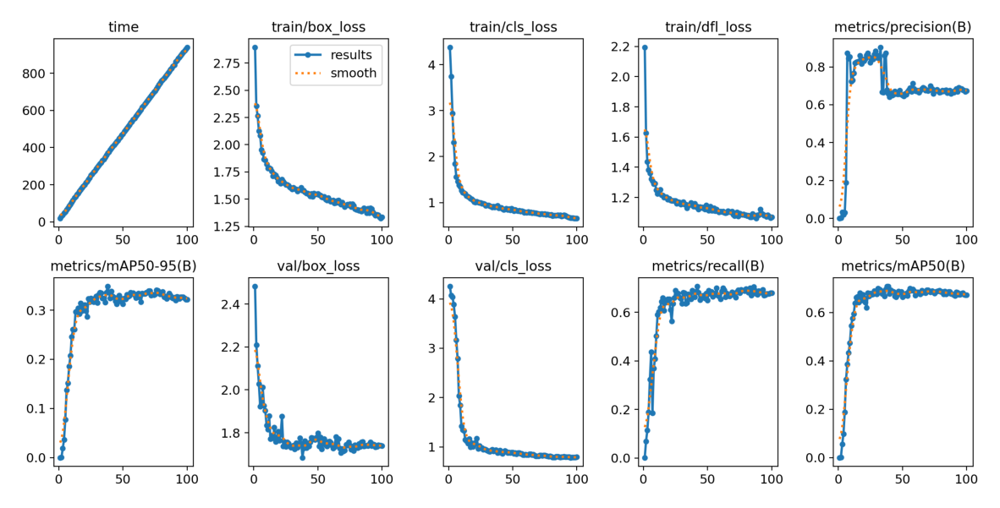

In [15]:
# Load the image
results_plot = Image.open(os.path.join(Main_Dir, 'runs/detect/train8/results.png'))

#Resize
plt.figure(figsize=(15, 12))  # Adjust the numbers to control size

# Display the image with Matplotlib
plt.imshow(results_plot)
plt.axis('off')  # Hide axis for better visualization
plt.show()

El análisis de las gráficas de pérdida, precisión y recall sugiere que el modelo está experimentando sobreajuste. La pérdida de entrenamiento disminuye de manera significativa, alcanzando un valor de 1.33, mientras que la pérdida de validación se estabiliza en 1.73, indicando una discrepancia que sugiere que el modelo memoriza los datos de entrenamiento en lugar de generalizar.

En cuanto a las métricas de precisión y recall, la precisión inicialmente alcanza un pico cercano a 0.8 pero luego desciende a aproximadamente 0.65, lo que implica un aumento en los falsos positivos. Por su parte, el recall también se estabiliza en 0.65, sugiriendo que el modelo capta solo una parte de los objetos relevantes.

En resumen, estos resultados indican que el modelo presenta signos de sobreajuste, lo que resalta la necesidad de ajustes adicionales, como la regularización o la recolección de más datos, para mejorar su capacidad de generalización.

### **Métrica**

Para este proyecto, se eligieron la precisión y el recall como métricas clave para evaluar el rendimiento del modelo en la identificación de componentes industriales en imágenes termográficas. La precisión es crucial, ya que busca minimizar los falsos positivos, lo cual es fundamental en un contexto donde un error en la identificación puede resultar en costos significativos. Por otro lado, el recall se centra en la capacidad del modelo para detectar la mayor cantidad posible de componentes relevantes, asegurando que no se pase por alto ningún elemento crítico.

Dado que el conjunto de datos puede presentar un desbalance entre las clases, el uso de estas métricas se vuelve especialmente relevante. A diferencia de la exactitud, que puede ofrecer una visión engañosa en situaciones de clases desbalanceadas, tanto la precisión como el recall brindan una evaluación más equilibrada y representativa del rendimiento del modelo. En consecuencia, su elección está alineada con los objetivos del proyecto, garantizando una identificación precisa y efectiva de los componentes en las imágenes analizadas. Esta selección de métricas permite una interpretación significativa en el contexto del negocio, asegurando que el modelo no solo sea efectivo, sino también útil en aplicaciones del mundo real.

### **Desempeño**

Para establecer un desempeño mínimo en nuestro modelo de detección de objetos utilizando YOLOv8n, es fundamental comparar su rendimiento con benchmarks históricos o estándares de la industria. En el contexto de detección de objetos, se suelen emplear métricas como precisión, recall y el índice F1 para evaluar la efectividad del modelo. Según Jocher et al. (2022), el rendimiento de los modelos YOLO, incluidos YOLOv5 y YOLOv8, muestra que, bajo condiciones óptimas de entrenamiento y un conjunto de datos bien etiquetado, se pueden alcanzar precisiones superiores al 85% en diversas aplicaciones.

En nuestro caso, establecemos como criterio que el modelo baseline debe alcanzar al menos un 75% de precisión en la identificación de componentes específicos, como Diodo/SCR, Fusible, Snubber y Cables. Este umbral se considera adecuado, dado que refleja la calidad del conjunto de datos utilizado y la importancia de una detección precisa en el contexto del análisis de anomalías. Al comparar los resultados de nuestro modelo con estos estándares, podemos verificar si se ha alcanzado un nivel aceptable de desempeño. En caso contrario, se deberán considerar ajustes en el proceso de entrenamiento, como la mejora en la calidad del conjunto de datos o el aumento de las épocas de entrenamiento.



# **Datos para Modelos de Aprendizaje No Supervisado**

Además de las imágenes previamente mencionadas para el modelo de visión computacional, se cuentan con archivos .csv que contienen las mediciones de temperatura obtenidas por los diversos sensores de la cámara, correspondientes a cada uno de los pixeles de los filtros mostrados en el apartado anterior.

Estos archivos, a los cuáles se les había hecho previamente un primer análisis exploratorio, fueron sujetos al proceso de ingeniería de características que se muestra a continuación.

### **Procesamiento Previamente Generado**

Se aplicaron varias de las operaciones de las semana anteriores para poder trabajar con el listado de archivos general.

In [74]:
# Procesamiento de archivos durante la apertura

# Procesos a aplicar a los archivos .csv
def process_df(df):

  # Removido de primeras dos filas debido a que contienen información irrelevante
  df= df.drop([0, 1])

  # Removido de título en el header y separación de datos a través de comas
  df = df['All temperatures in °C.'].str.split(',', expand=True)

  # Conversión a formato numérico de los datos en el dataframe
  df = df.apply(pd.to_numeric, errors='coerce')

  # Fill NaN with zeros (or another strategy)
  df = df.fillna(30)

  # Eliminado de primera columna, debido a que contiene los índices de las filas
  df = df.drop([0], axis=1)

  # Eliminado de última columna, debido a que se genera durante la apertura y no corresponde a las formas de las imágenes
  df = df.drop(df.columns[-1], axis=1)

  # Reseteo de los índices en los dataframes
  df.reset_index(drop=True, inplace=True)

  return df

In [75]:
# Inicialización de una lista vacía para guardar los DataFrames procesados y sus nombres
processed_dataframes = []
proc_dataframe_names = []

In [76]:
# Apertura de los archivos .csv en el folder Medición de Temperaturas

# Iteración a través de los archivos dentro del folder
for filename in os.listdir(Temp_Dir):
    if filename.endswith('.csv'):
        file_path = os.path.join(Temp_Dir, filename)

        # Lectura de cada archivo .csv en un DataFrame
        df = pd.read_csv(file_path, encoding='utf-16', sep='\t')

        # Procesamiento del DataFrame
        processed_df = process_df(df)

        # Añadido del Dataframe a la lista de archivos procesados
        processed_dataframes.append(processed_df)

        # Añadido del nombre del Dataframe a la lista de nombres
        proc_dataframe_names.append(filename)

In [77]:
# Impresión de datos estadísticos descriptivos, forma y los tipos de datos de los primeros 5 Dataframes procesados

# Iteración de los primeros 5 Dataframes
for i, (name, df) in enumerate(zip(proc_dataframe_names, processed_dataframes[:5])):

    # Impresión del nombre del DataFrame
    print(f"{i + 1}. Filename: {name}"+ "\n")

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Impresión de datos estadísticos descriptivos
    print(f"Descripción Estadística de los Datos del DataFrame:\n {df.describe()}"+ "\n")

    # Impresión de la forma del Dataframe y el conteo de la cantidad de pixeles por cada dimensión
    shape = df.shape
    print(f"Tamaño del DataFrame: {shape}")
    print(f"Cantidad de Pixeles en Dimensión Horizontal: {shape[1]}" + " px")
    print(f"Cantidad de Pixeles en Dimensión Vertical: {shape[0]}"+ " px\n")

    # Comprobación de los Tipos de Dato dentro del Dataframe
    print(f"Tipo de Dato en Eje X: {df.columns.dtype}")
    print(f"Tipo de Dato en Eje Y: {df.index.dtype}")
    print(f"Tipo de Dato en Eje Z: {df.values.dtype}")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

1. Filename: IR_00025.csv

DataFrame 1:

Descripción Estadística de los Datos del DataFrame:
              1          2          3          4          5          6    \
count  90.000000  90.000000  90.000000  90.000000  90.000000  90.000000   
mean   33.723333  34.312222  34.577778  34.674444  34.621111  34.686667   
std     1.731600   1.772881   1.911337   1.725783   1.421938   1.340904   
min    31.500000  31.800000  32.100000  32.200000  32.300000  32.300000   
25%    32.300000  32.600000  32.625000  33.050000  33.200000  33.450000   
50%    33.200000  34.050000  34.600000  35.000000  35.000000  34.900000   
75%    35.175000  35.875000  35.600000  35.750000  35.600000  35.600000   
max    38.400000  37.900000  39.600000  39.200000  37.500000  37.300000   

             7          8          9          10   ...        111        112  \
count  90.000000  90.000000  90.000000  90.000000  ...  90.000000  90.000000   
mean   34.781111  34.728889  34.711111  34.741111  ...  31.548889  31.

In [78]:
# Impresión de estadísticas principales de los primeros 5 Dataframes procesados

# Iteración de los primeros 5 Dataframes
for i, (name, df) in enumerate(zip(proc_dataframe_names, processed_dataframes[:5])):

    # Impresión del nombre del DataFrame
    print(f"{i + 1}. Filename: {name}"+ "\n")

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Aplanado del Dataframe a una Serie de 1D y conversión a una serie de Pandas
    flattened_data = df.values.flatten()
    flattened_series = pd.Series(flattened_data)

    # Cálculo del máximo, mínimo, promedio, desviación estándar, asímetria y curtosis de las Temperaturas Medidas
    max_value = df.max().max()  # Valor Máximo en el DataFrame
    min_value = df.min().min()  # Valor Mínimo en el DataFrame
    mean_value = df.mean().mean()  # Valor Promedio en el DataFrame
    std_dev = df.std().mean()  # Desviación Estándar en el DataFrame
    skewness = flattened_series.skew() # Asimetría en el DataFrame
    kurtosis = flattened_series.kurt() # Curtosis en el DataFrame

    # Impresión de Resultados
    print(f"Valor Máximo: {max_value}"+ " °C")
    print(f"Valor Mínimo: {min_value}"+ " °C")
    print(f"Valor Promedio: {mean_value:.2f}"+ " °C")
    print(f"Desviación Estándar: {std_dev:.2f}")
    print(f"Asimetría: {skewness:.2f}")
    print(f"Curtosis: {kurtosis:.2f}")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

1. Filename: IR_00025.csv

DataFrame 1:

Valor Máximo: 44.9 °C
Valor Mínimo: 30.3 °C
Valor Promedio: 34.48 °C
Desviación Estándar: 1.12
Asimetría: 0.50
Curtosis: 0.01


2. Filename: IR_00023.csv

DataFrame 2:

Valor Máximo: 45.8 °C
Valor Mínimo: 31.9 °C
Valor Promedio: 35.17 °C
Desviación Estándar: 1.12
Asimetría: 0.54
Curtosis: 0.38


3. Filename: IR_00021.csv

DataFrame 3:

Valor Máximo: 43.0 °C
Valor Mínimo: 30.3 °C
Valor Promedio: 34.40 °C
Desviación Estándar: 0.96
Asimetría: 0.34
Curtosis: -0.26


4. Filename: IR_00024.csv

DataFrame 4:

Valor Máximo: 45.5 °C
Valor Mínimo: 31.4 °C
Valor Promedio: 34.92 °C
Desviación Estándar: 1.17
Asimetría: 0.59
Curtosis: 0.52


5. Filename: IR_00022.csv

DataFrame 5:

Valor Máximo: 45.3 °C
Valor Mínimo: 31.9 °C
Valor Promedio: 35.42 °C
Desviación Estándar: 0.81
Asimetría: 0.54
Curtosis: -0.38




In [79]:
# Inicialización de listas vacías para guardar los valores de los DataFrames que pertenecen a los ejes de las gráficas
X_list = []
Y_list = []
Z_list = []

In [80]:
# Iteración a través de los dataframes procesados
for df in processed_dataframes:
  # Creación de los vectores del grid (X,Y) basado en las columnas e índices del DataFrame, con una conversión de tipos de datos incluida.
  # Esta conversión se considera para poder hacer uso del grid correctamente al intentar graficarlo.
  X, Y = np.meshgrid(df.columns.astype(float), df.index.astype(float))

  # Creación de Z, correspondiente a los valores de temperatura en el DataFrame.
  Z = df.values

  # Añadido de los vectores a la lista de vectores para graficado
  X_list.append(X)
  Y_list.append(Y)
  Z_list.append(Z)

In [81]:
# Definición de Función para visualizar datos en 2D

def Surf2D(df,X,Y,Z):
    # Creación de un contorno relleno para graficar el Dataframe de dos dimensiones.
    # Se toma en cuenta la escala de colores "Inferno" nuevamente.
    plt.figure(figsize=(8, 6))
    plt.contourf(X, Y, Z, cmap='inferno')

    # Añadido de una barra de color, que representa la escala de temperatura detectada.
    plt.colorbar()

    # Ajustado de los límites de la barra de colores según los valores mínimos y máximos del Dataframe.
    plt.clim(df.min().min(), df.max().max())

    # Añadido de etiquetas correspondientes a cada eje.
    plt.xlabel('X (Pixels)')
    plt.ylabel('Y (Pixels)')
    plt.title('2D Contour Plot of Temperature')

    # Mostrado del gráfico.
    plt.show()

In [82]:
# Definición de Función para visualizar datos en 3D

def Surf3D(df,X,Y,Z):
    # Generación del gráfico en 3D
    fig = plt.figure(figsize=(14, 10))  # Tamaño arbitrario. Puede ajustarse.
    ax = fig.add_subplot(111, projection='3d')

    # Graficado de la gráfica de superficie, con un mapa de colores ("Inferno") equivalente a la escala de colores "Ironbow" en la que se aprecian
    # los filtros infrarrojos en las imágenes a procesar.
    surf = ax.plot_surface(X, Y, Z, cmap='inferno')

    # Añadido de una barra de color, que representa la escala de temperatura detectada.
    cbar = fig.colorbar(surf)

    # Ajustado de los límites de la barra de colores según los valores mínimos y máximos del Dataframe.
    surf.set_clim(df.min().min(), df.max().max())

    # Añadido de etiquetas correspondientes a cada eje.
    ax.set_xlabel('X (Pixels)')
    ax.set_ylabel('Y (Pixels)')
    ax.set_zlabel('Temperature (°C)')

    # Mostrado del gráfico.
    plt.show()

1. Filename: IR_00025.csv

DataFrame 1:



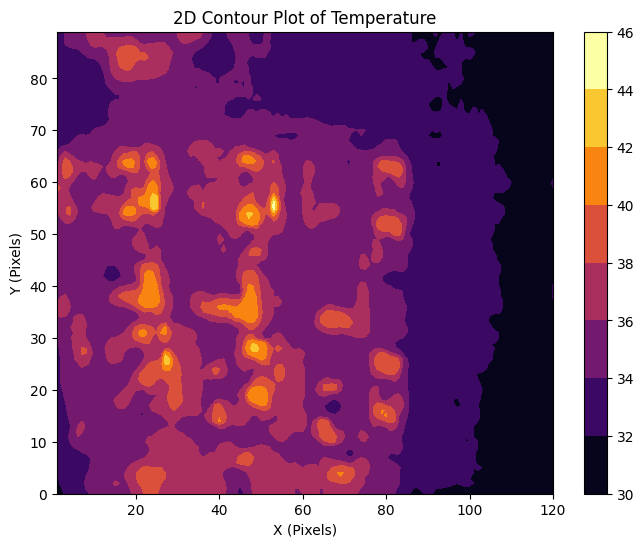

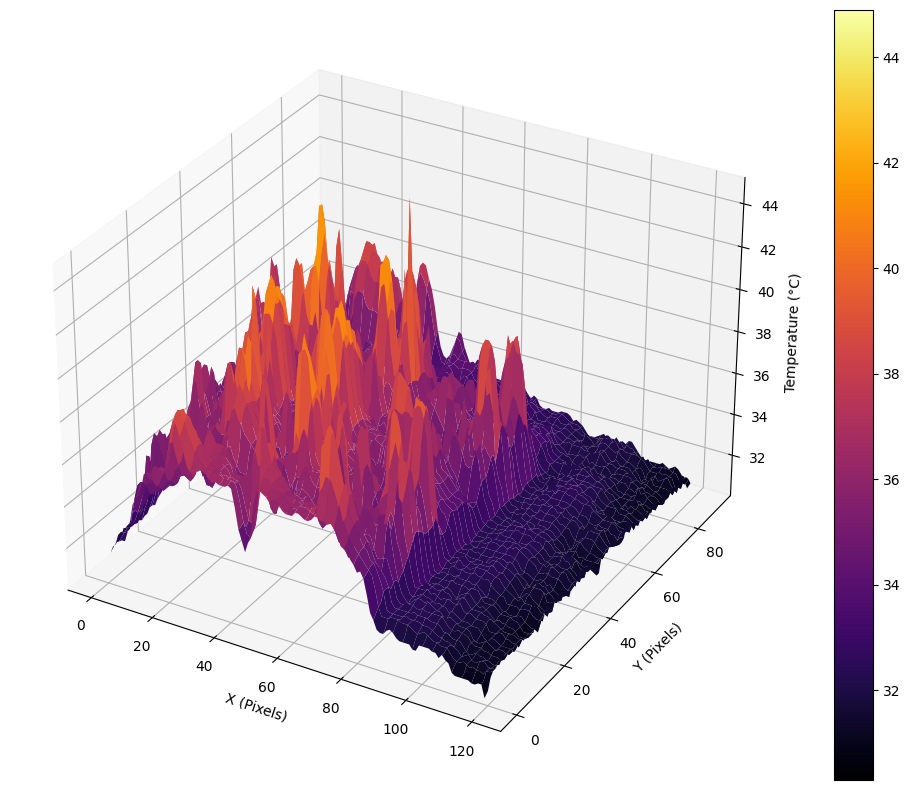



2. Filename: IR_00023.csv

DataFrame 2:



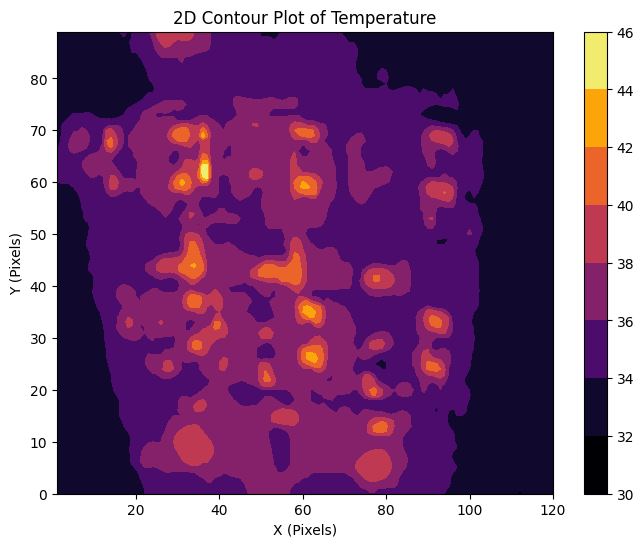

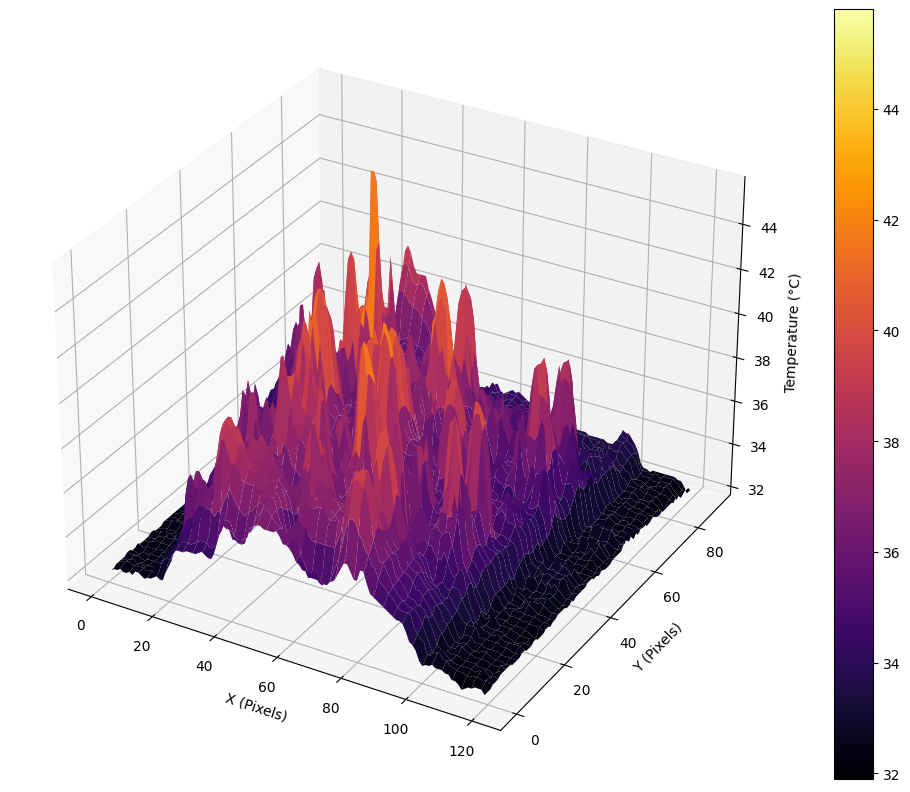



3. Filename: IR_00021.csv

DataFrame 3:



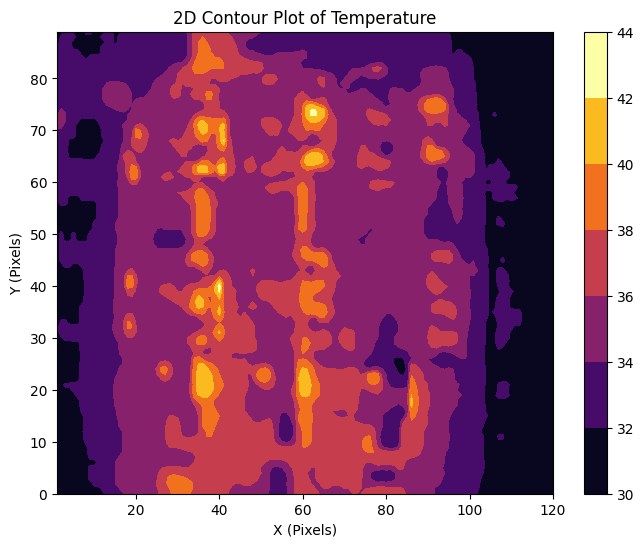

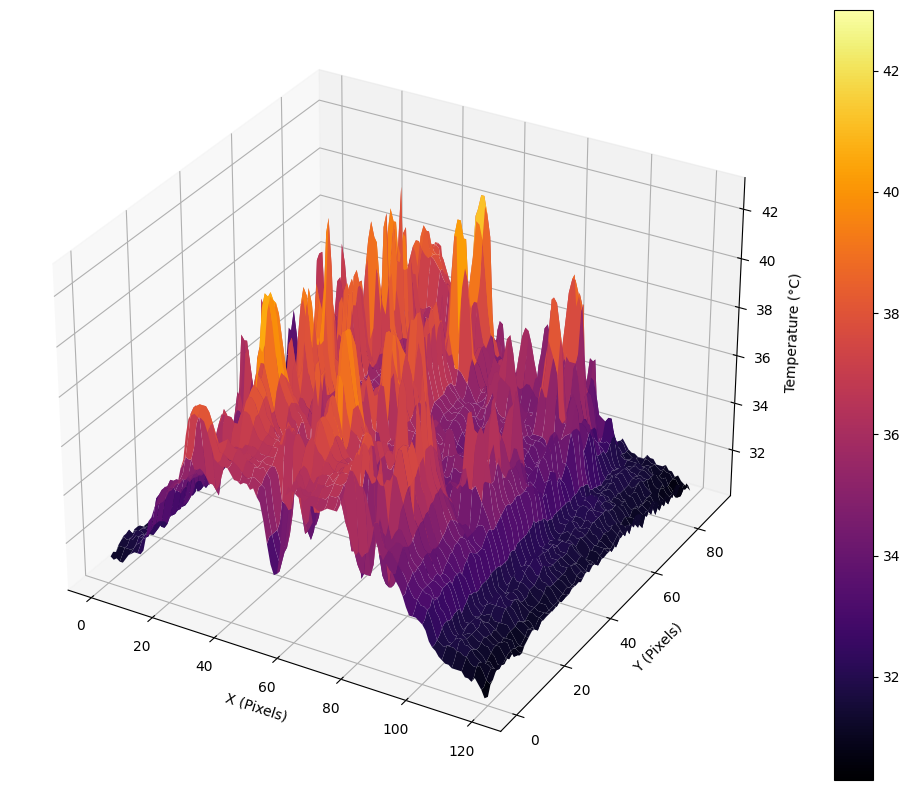



4. Filename: IR_00024.csv

DataFrame 4:



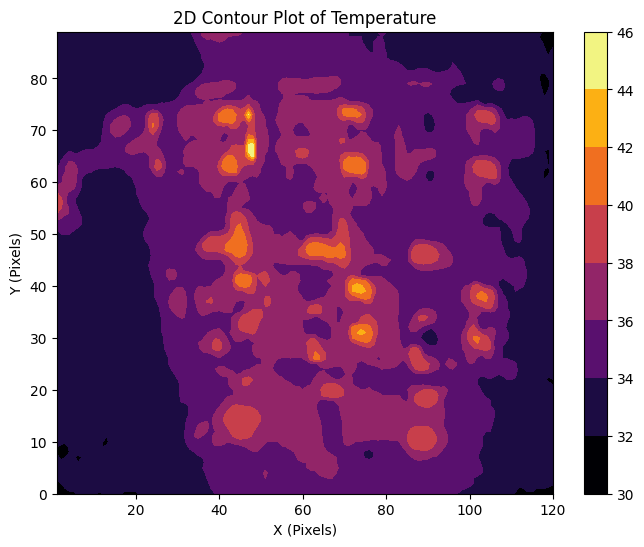

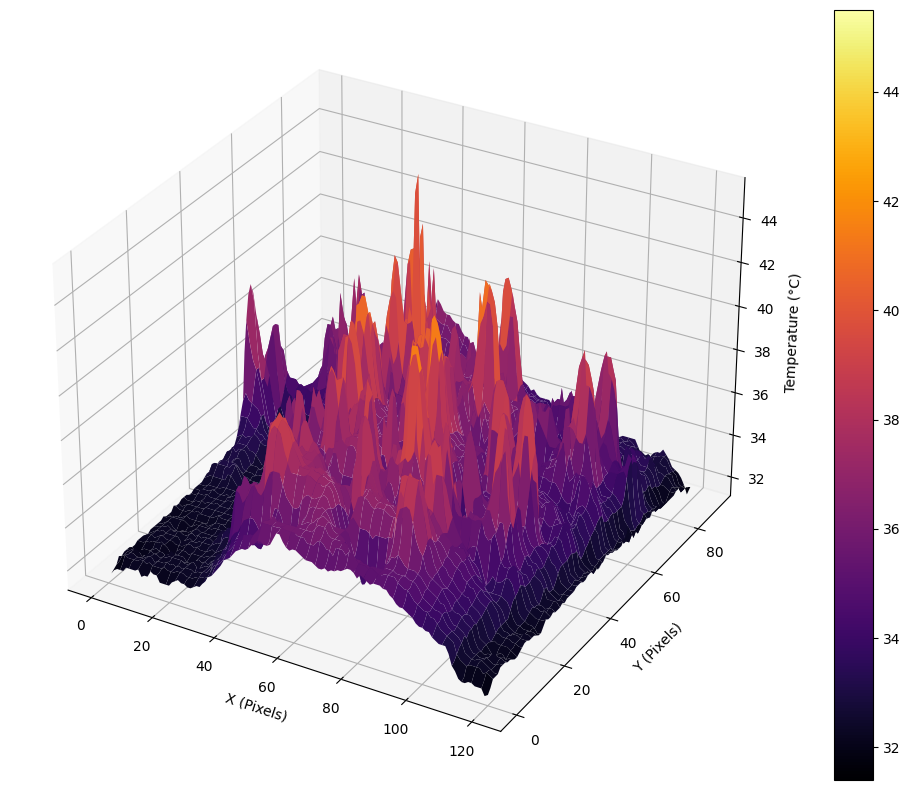



5. Filename: IR_00022.csv

DataFrame 5:



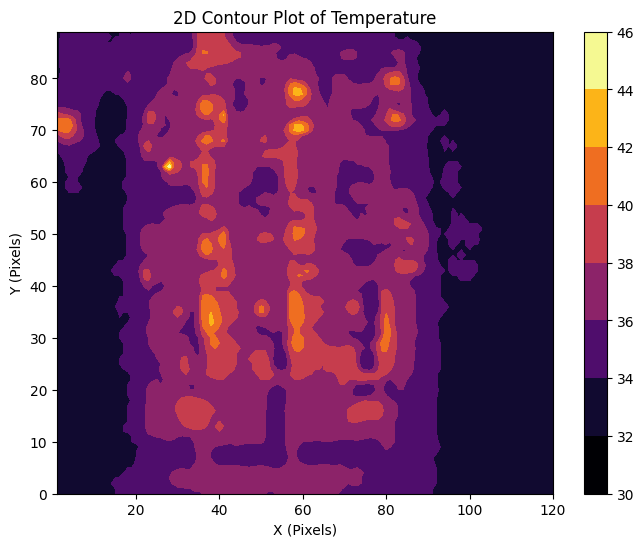

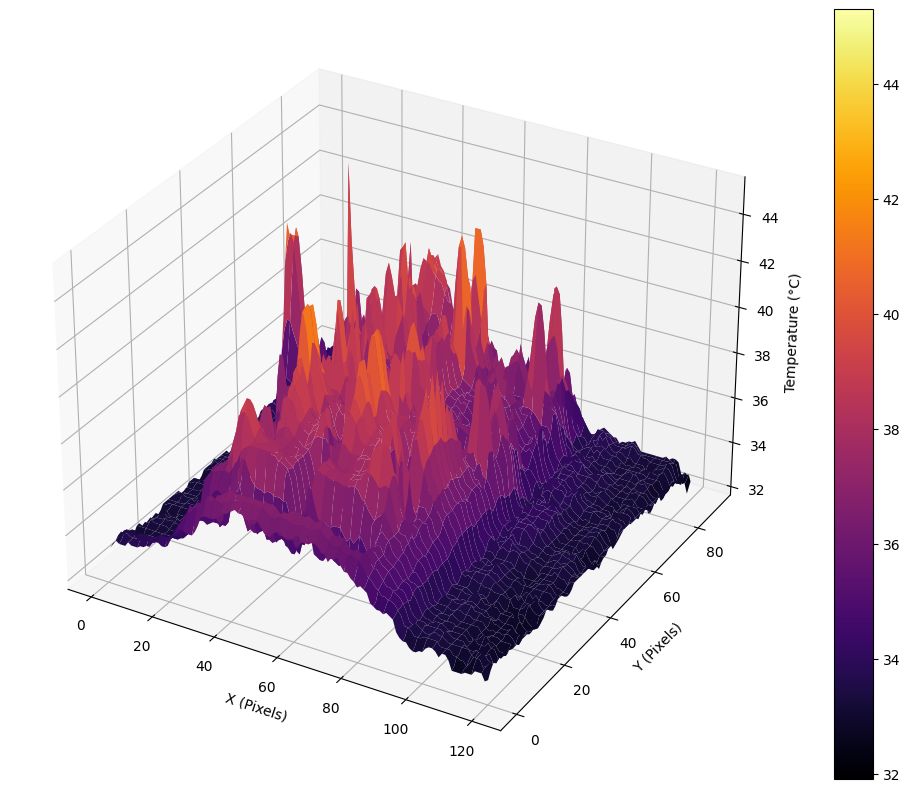

In [83]:
# Impresión de mapas de superficie con las mediciones de temperatura obtenidas

# Iteración de los primeros 5 Dataframes
for i, (name, df) in enumerate(zip(proc_dataframe_names, processed_dataframes[:5])):

    # Impresión del nombre del DataFrame
    print(f"{i + 1}. Filename: {name}"+ "\n")

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Impresión de mapa de contorno en 2D de las temperaturas medidas
    Surf2D(df, X_list[i], Y_list[i], Z_list[i])
    print("\n")

    # Impresión de mapa de superficie en 3D de las temperaturas medidas
    Surf3D(df, X_list[i], Y_list[i], Z_list[i])

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

### **Preparación de Funciones para Aplicación sobre listado de archivos**

### **Construcción de Nuevas Características**

El primer paso que se llevó a cabo al realizar la ingeniería de características, corresponde a la construcción de nuevas características con respecto a los conjuntos de datos con los que contamos.

Se decidió generar la siguiente característica, debido a los beneficios y potencial uso que puede brindar a futuro:


1.   Dataframe con banderas binarias (*binary flags*) correspondientes a los valores atípicos o extremos en las mediciones de temperatura

**Valores Atípicos o Extremos (Anomalías)**

En primer lugar, se llevó a cabo la generación del dataframe con los valores atípicos, siguiendo la siguiente forma:

**Outlier i,j** =
*   *{1, if Ti,j > Tmean + 3×σ}*
*   *{1, if Ti,j < Tmean - 3×σ}*
*   *{0, otherwise}*

In [84]:
# Creación de Matriz Binaria relacionada a los valores atípicos con respecto a los límites

def outliers (df, mean_value, std_dev):
  # Asignación de valores a las variables para el promedio y desviación estándar de la imagen ejemplo
  mean_temp = mean_value
  std_temp = std_dev

  # Definición de los límites superior e inferior para los valores atípicos
  upper_thrs = mean_temp + 3 * std_temp
  lower_thrs = mean_temp - 3 * std_temp

  # Creación de una matriz binaria
  outliers = pd.DataFrame(np.where((df > upper_thrs) | (df < lower_thrs), 1, 0))

  # Visualización de los resultados
  print("Mapa de Valores Atípicos (1 = outlier, 0 = normal):\n", outliers)

  return outliers

Para la generación de esta característica, se hizo uso de los datos previo a que se les aplicaran técnicas de transformación y escalamiento. Esto es debido a que se busca mantener la relación de los comportamientos, además de encontrar los puntos extremos con respecto a la escala correspondiente previa al aplicado de estas técnicas.

### **Estandarización y normalización**

Una vez que se generó un nuevo conjunto de datos con las banderas que corresponden a los puntos de la imagen en temperaturas atípicas o extremas, se llevó a cabo la transformación de los datos.

Esto se llevó a cabo mediante el uso la normalización min-max debido a que no se busca normalizar las distribuciones de los comportamientos en las imágenes, gracias a que la intención es observar y detectar las anomalías.

In [85]:
# Transformación de datos numéricos

def normalization(df):
  # Normalización Min-Max de los datos
  scaler_minmax = MinMaxScaler()
  temp_norm = scaler_minmax.fit_transform(df)

  # Convertir de nuevo a DataFrame si es necesario
  temp_norm = pd.DataFrame(temp_norm, columns=df.columns)

  # Impresión de los resultados
  print("Dataframe Normalizado:\n",temp_norm)

  return temp_norm

### **Selección/Extracción de Características**

Para poder facilitar el proceso de entrenamiento de los modelos de agrupación, se filtró el dataframe de mediciones de temperatura al obtener los gradientes de cada pixel, considerando su magnitud y dirección.

Esto debido a que un dataframe de gradientes puede mostrar las relaciones de comportamiento en los diferentes grupos de pixeles de mejor manera qué solo las mediciones de temperaturas.

#### **Operaciones con Gradientes**

Se decidió llevó a cabo el cálculo de los gradientes en la imagen. Esto es debido a que al contar con las magnitudes, direcciones y velocidades (representadas por la varianza) de los gradientes de cada pixel en las imágenes, se pueden realizar muchas inferencias correspondientes al comportamiento de las temperaturas en la imagen, además de brindar un marco de comparación que puede ser útil previo a la definición de modelos de agrupamiento.

Además de lo anterior, se llevaron a cabo algunos cálculos estadísticos con respecto a la magnitud de los gradientes para observar la varianza de las magnitudes, junto al valor promedio.

In [86]:
# Operaciones relacionadas con gradientes

def gradient_comps(df):

  # Cálculo de los gradientes en la dirección 'x' (horizontal) y la dirección 'y' (vertical).
  grad_x = np.diff(df, axis=1)  # Gradiente a través del eje 'x'
  grad_y = np.diff(df, axis=0)  # Gradiente a través del eje 'y'

  # Debido a que np.diff reduce las dimensiones del arreglo, se aplica un relleno al resultado (padding) para que coincidan con los tamaños originales
  grad_x = np.pad(grad_x, ((0, 0), (0, 1)), mode='edge')  # Padding a la última columna
  grad_y = np.pad(grad_y, ((0, 1), (0, 0)), mode='edge')  # Padding a la última fila

  # Cálculo de la magnitud y la dirección de los gradientes
  grad_mag = np.sqrt(grad_x**2 + grad_y**2)
  grad_dir = np.arctan2(grad_y, grad_x) # En radianes, debido al uso de np.arctan2

  # Conversión de las direcciones de los gradientes de radianes a grados
  grad_dirdeg = np.degrees(grad_dir)

  # Ajuste aplicado a las direcciones para que todos los grados sean positivos
  grad_dirdeg = (grad_dirdeg + 360) % 360

  # Cálculo de la magnitud promedio de los gradientes
  avg_mag = np.mean(grad_mag)

  # Cálculo de la varianza en la magnitud de los gradientes
  var_mag = np.var(grad_mag)

  # Visualización de los resultados
  print("Gradiente por Pixel(x):\n", grad_x)
  print("\nGradiente por Pixel(y):\n", grad_y)
  print("\nMagnitud del Gradiente por Pixel:\n", grad_mag)
  print("\nDirección del Gradiente (radianes) por Pixel:\n", grad_dir)
  print("\nDirección del Gradiente (grados) por Pixel:\n", grad_dirdeg)
  print(f"\nPromedio de las Magnitudes de los Gradientes: {avg_mag:.4f}")
  print(f"\nVarianza de las Magnitudes de los Gradientes: {var_mag:.4f}")

  return grad_mag, grad_dir, grad_dirdeg

Una vez que se obtiene la información anterior, se genera una gráfica conocida como *Histogram of Gradients (HOG)* con respecto a las direcciones de los gradientes, en la cuál se pueden apreciar los patrones de movimiento de los gradientes en la imagen representada.

Es decir, se grafican las frecuencias de las direcciones hacia donde tienden los gradientes en un rango de 360° (0 - 2*pi), para encontrar la dirección hacia donde tienden los cambios de temperatura en la imagen.

Además de esto, se grafica una visualización del histograma de gradientes. Esta gráfica denota el comportamiento y la tendencia de movimiento de los gradientes de los pixeles en la imagen. El hacer uso de estos dataframes con los gradientes para complementar el proceso de comparación entre diferentes imágenes, puede ser más efectivo que solamente haciendo uso de las mediciones en cada punto.

In [87]:
# Cálculo del Histograma de Gradientes (HOG) con las direcciones de los gradientes

def HOG_dir(grad_dirdeg, bins, bin_width):
  # Cómputo del histograma de las direcciones de los gradientes
  hog, bin_edges = np.histogram(grad_dirdeg, bins=bins, range=(0, 360))

  # Impresión de los valores del histograma
  print("Histograma de las Direcciones de Gradientes (Grados):\n", hog)
  print("\n")

  # Ploteado del histograma
  plt.bar(bin_edges[:-1], hog, width=bin_width, edgecolor='black')
  plt.title('Histograma de las Direcciones de Gradientes (Grados)')
  plt.xlabel('Dirección (Grados)')
  plt.ylabel('Frecuencia')
  plt.show()

In [88]:
# Visualización del Histograma de Gradientes

def HOV_df(grad_mag, grad_dir, height, width, step):

  # Definición de las componentes de los vectores a graficar
  U = grad_mag * np.cos(grad_dir)  # Componente en X
  V = grad_mag * np.sin(grad_dir)  # Componente en Y

  # Creación de un grid para el graficado de los vectores
  X, Y = np.meshgrid(np.arange(0, width), np.arange(0, height))

  # Graficado de las flechas (vectores) del Histograma de Gradientes (HOG)
  plt.figure(figsize=(14, 14))

  # Submuestreo para una mejor visualización
  plt.quiver(X[::step, ::step], Y[::step, ::step], U[::step, ::step], V[::step, ::step],
           grad_mag[::step, ::step], angles='xy', scale_units='xy', scale=1, cmap='inferno')

  # Personalización de la gráfica
  plt.gca().invert_yaxis()  # Inversión del eje 'y' para una orientación correcta
  plt.title("Visualización del HOG")
  plt.xlabel("Eje X")
  plt.ylabel("Eje Y")
  plt.colorbar(label="Magnitud del Gradiente")  # Mostrado de la barra de colores para representar las magnitudes
  plt.show()

In [89]:
# Inicialización de listas para almacenar resultados
Outliers = []
Normal_Temp = []
Grad_Mag = []
Grad_Dir = []
Grad_DirDeg = []

In [90]:
# Impresión de dataframes de valores atípicos y normalizados

# Iteración de los primeros 5 Dataframes
for i, (name, df) in enumerate(zip(proc_dataframe_names, processed_dataframes[:5])):

    # Impresión del nombre del DataFrame
    print(f"{i + 1}. Filename: {name}"+ "\n")

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Generación de Dataframe de Valores Atípicos y almacenamiento en la lista correspondiente
    outlier = outliers(df, df.mean().mean(), df.std().mean())
    Outliers.append(outlier)
    print("\n")

    # Normalización de Dataframe y almacenamiento en la lista correspondiente
    temp_norm = normalization(df)
    Normal_Temp.append(temp_norm)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

1. Filename: IR_00025.csv

DataFrame 1:

Mapa de Valores Atípicos (1 = outlier, 0 = normal):
     0    1    2    3    4    5    6    7    8    9    ...  110  111  112  113  \
0     0    0    0    0    0    0    0    0    0    0  ...    1    1    1    1   
1     0    0    0    0    0    0    0    0    0    0  ...    1    1    1    1   
2     0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
3     0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
4     0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
..  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
85    0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
86    0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
87    0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
88    0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
89    0    0   

In [91]:
# Impresión de operaciones de gradientes de los dataframes

# Iteración de los primeros 5 Dataframes
for i, (name, df) in enumerate(zip(proc_dataframe_names, Normal_Temp[:5])):

    # Impresión del nombre del DataFrame
    print(f"{i + 1}. Filename: {name}"+ "\n")

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Operaciones con Gradientes y almacenamiento en la lista correspondiente
    grad_mag, grad_dir, grad_dirdeg = gradient_comps(df)
    Grad_Mag.append(grad_mag)
    Grad_Dir.append(grad_dir)
    Grad_DirDeg.append(grad_dirdeg)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

1. Filename: IR_00025.csv

DataFrame 1:

Gradiente por Pixel(x):
 [[          0           0           0 ...    -0.14286           0           0]
 [  -0.012592    0.010273   -0.012381 ...     0.28571     -0.2381     -0.2381]
 [   0.036588   -0.025574   -0.011429 ...           0    -0.24762    -0.24762]
 ...
 [    0.10858   -0.044809    0.047619 ...     0.28571    0.038095    0.038095]
 [    0.15015   -0.028415    0.047619 ...     0.28571   -0.095238   -0.095238]
 [    0.13186   0.0043716    0.047619 ...    0.071429   -0.080952   -0.080952]]

Gradiente por Pixel(y):
 [[   0.028986    0.016393    0.026667 ...     0.14286     0.57143     0.33333]
 [          0     0.04918    0.013333 ...     0.42857     0.14286     0.13333]
 [   0.014493    0.016393           0 ...           0           0           0]
 ...
 [  -0.057971   -0.016393           0 ...           0           0    -0.13333]
 [  -0.014493   -0.032787           0 ...           0    -0.21429        -0.2]
 [  -0.014493   -0.032787   

1. Filename: IR_00025.csv

DataFrame 1:

Histograma de las Direcciones de Gradientes (Grados):
 [1677  243  243  198  324  217  240  236  233  389  216  197  171  223  192  183  164   92 1230  211  238  263  322  229  290  268  236  440  184  219  183  269  198  227  226  129]




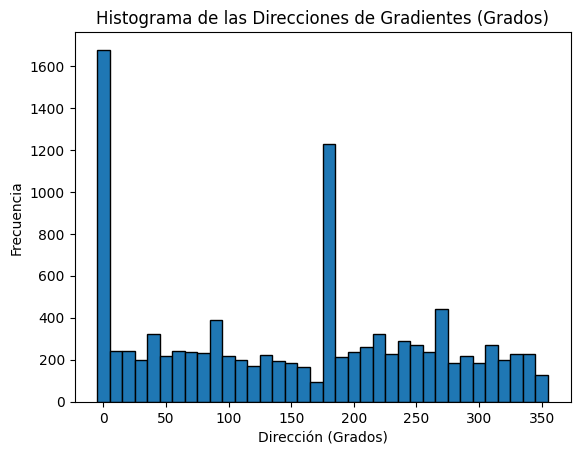





2. Filename: IR_00023.csv

DataFrame 2:

Histograma de las Direcciones de Gradientes (Grados):
 [1572  254  271  248  256  249  266  268  270  358  236  212  215  193  177  194  191   92 1408  255  222  230  274  262  247  208  269  322  230  217  196  207  175  222  211  123]




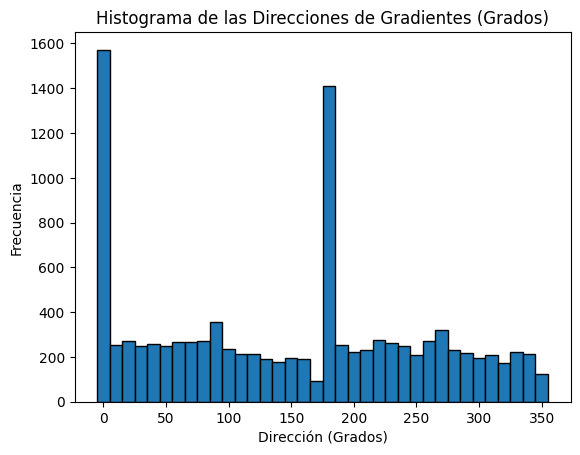





3. Filename: IR_00021.csv

DataFrame 3:

Histograma de las Direcciones de Gradientes (Grados):
 [1583  271  294  279  304  208  254  247  206  337  214  167  182  194  178  194  230  118 1264  215  277  257  271  238  249  209  230  337  225  202  183  268  231  266  260  158]




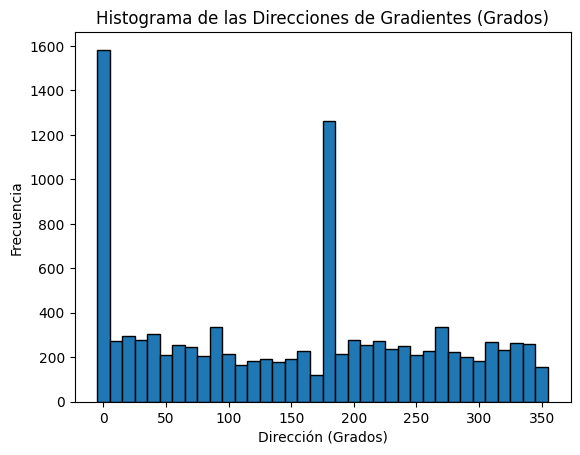





4. Filename: IR_00024.csv

DataFrame 4:

Histograma de las Direcciones de Gradientes (Grados):
 [1531  282  270  222  270  234  254  261  275  404  236  204  188  239  196  219  216   76 1303  276  238  210  250  219  258  233  218  371  223  173  182  233  203  225  257  151]




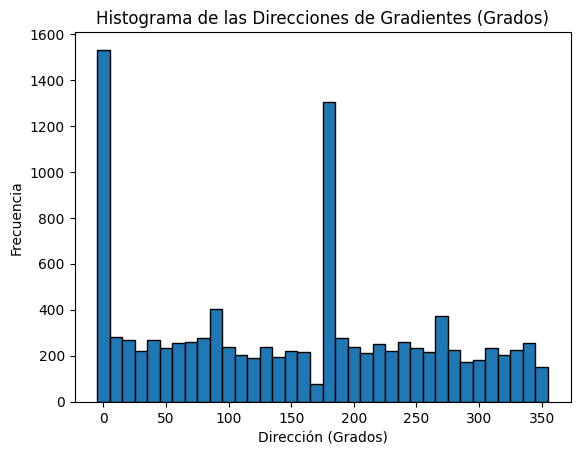





5. Filename: IR_00022.csv

DataFrame 5:

Histograma de las Direcciones de Gradientes (Grados):
 [2080  232  248  214  299  227  187  206  233  427  183  185  168  187  173  194  199   70 1381  201  249  232  297  214  234  198  208  443  164  170  177  174  159  224  203  160]




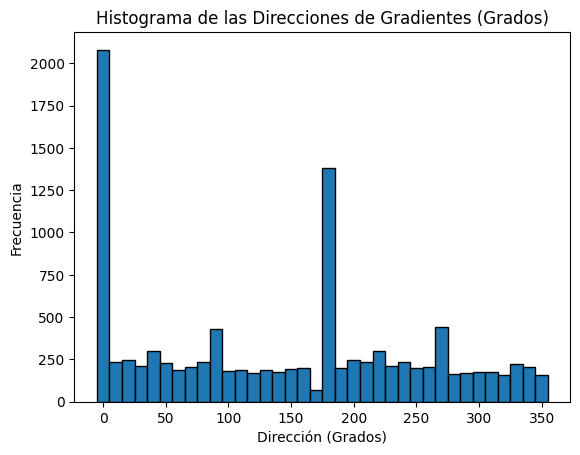

In [92]:
# Impresión de histogramas de las direcciones de los gradientes de los dataframes

# Definición del número de 'bins'
num_bins = 36  # Para generar intervalos de 10 grados, al estar las direcciones en grados

# Iteración de los primeros 5 Dataframes
for i, (name, df) in enumerate(zip(proc_dataframe_names, Normal_Temp[:5])):

    # Impresión del nombre del DataFrame
    print(f"{i + 1}. Filename: {name}"+ "\n")

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Graficado de los Histogramas de las Direcciones de Gradientes
    HOG_dir(Grad_DirDeg[i], num_bins, 10)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

1. Filename: IR_00025.csv

DataFrame 1:



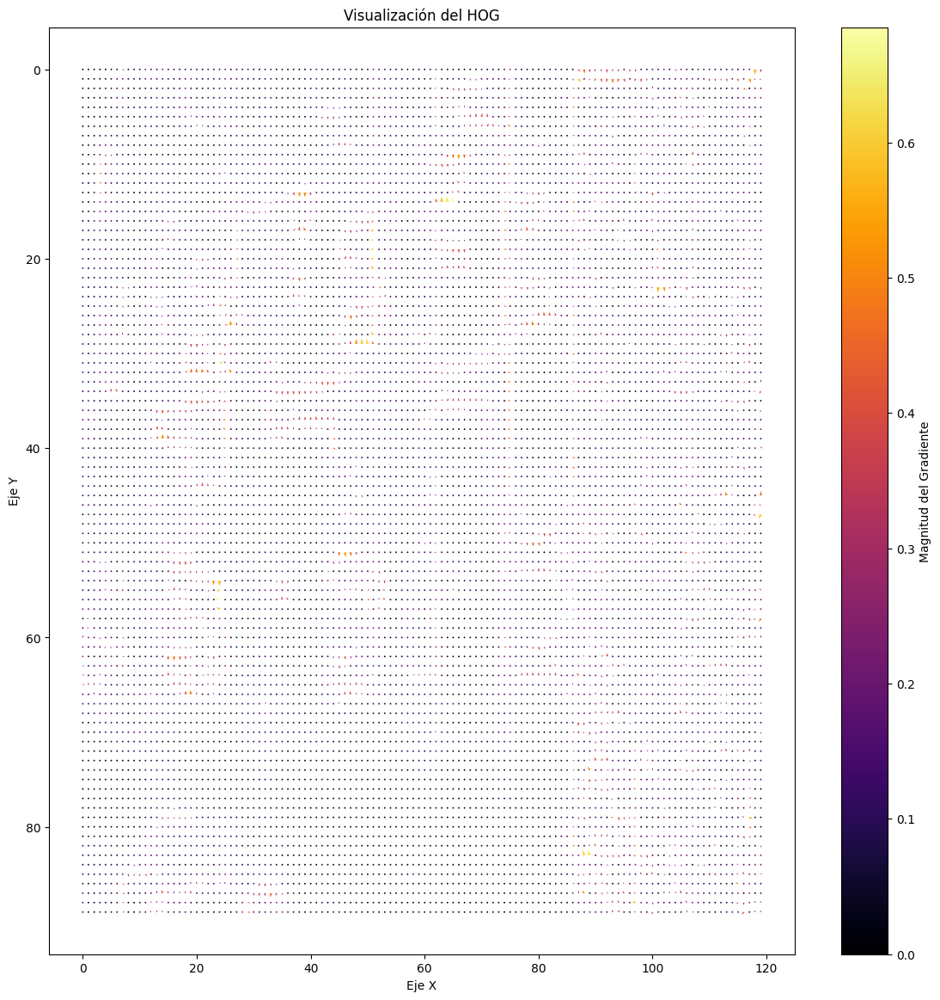





2. Filename: IR_00023.csv

DataFrame 2:



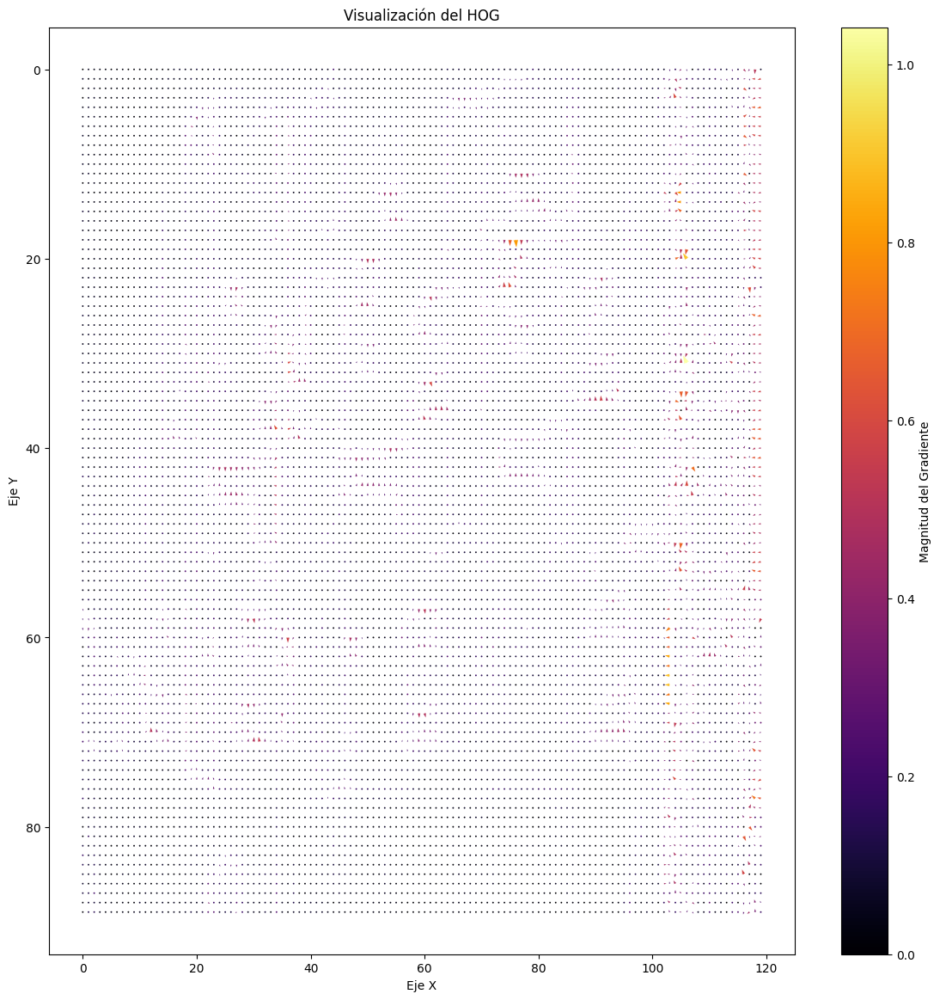





3. Filename: IR_00021.csv

DataFrame 3:



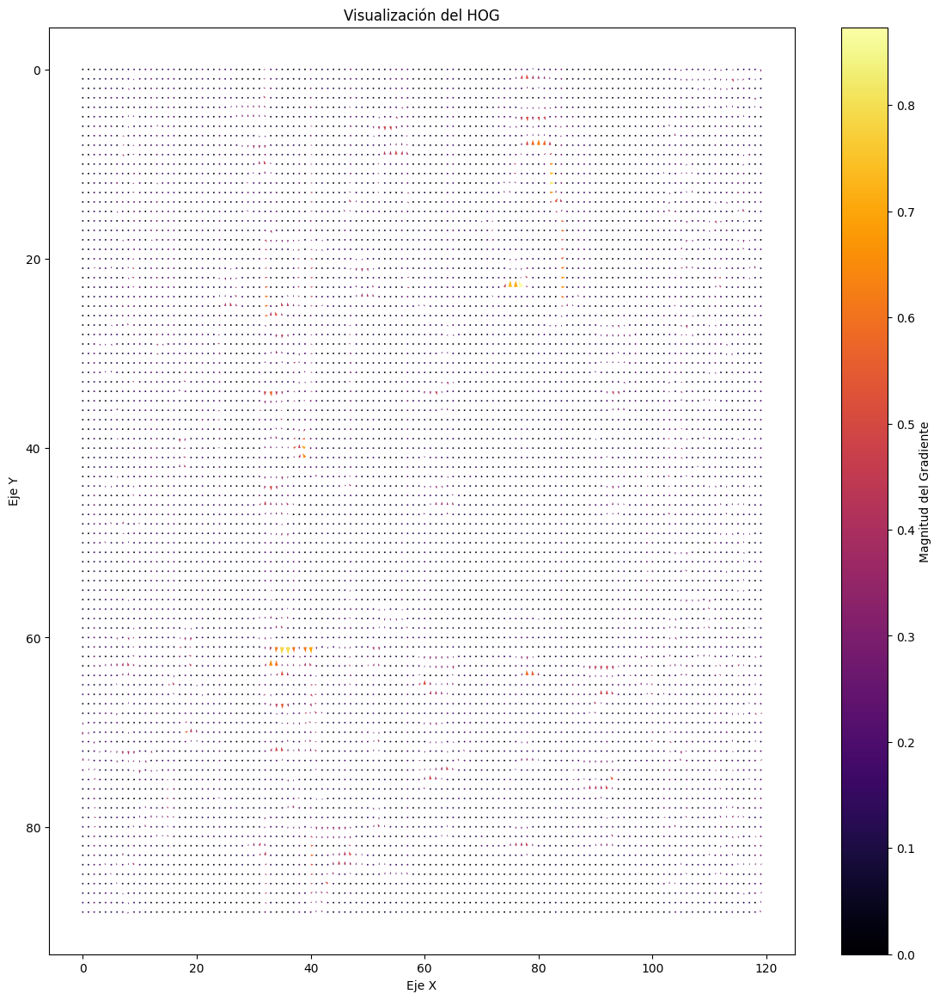





4. Filename: IR_00024.csv

DataFrame 4:



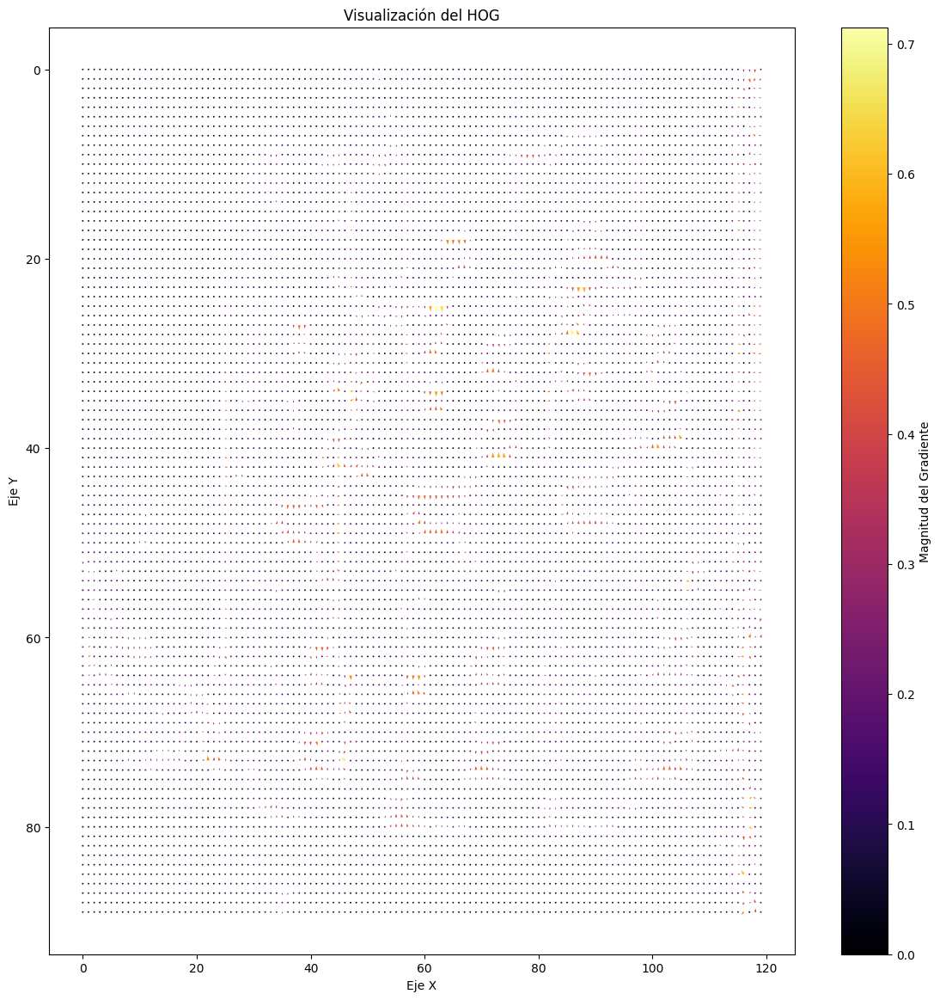





5. Filename: IR_00022.csv

DataFrame 5:



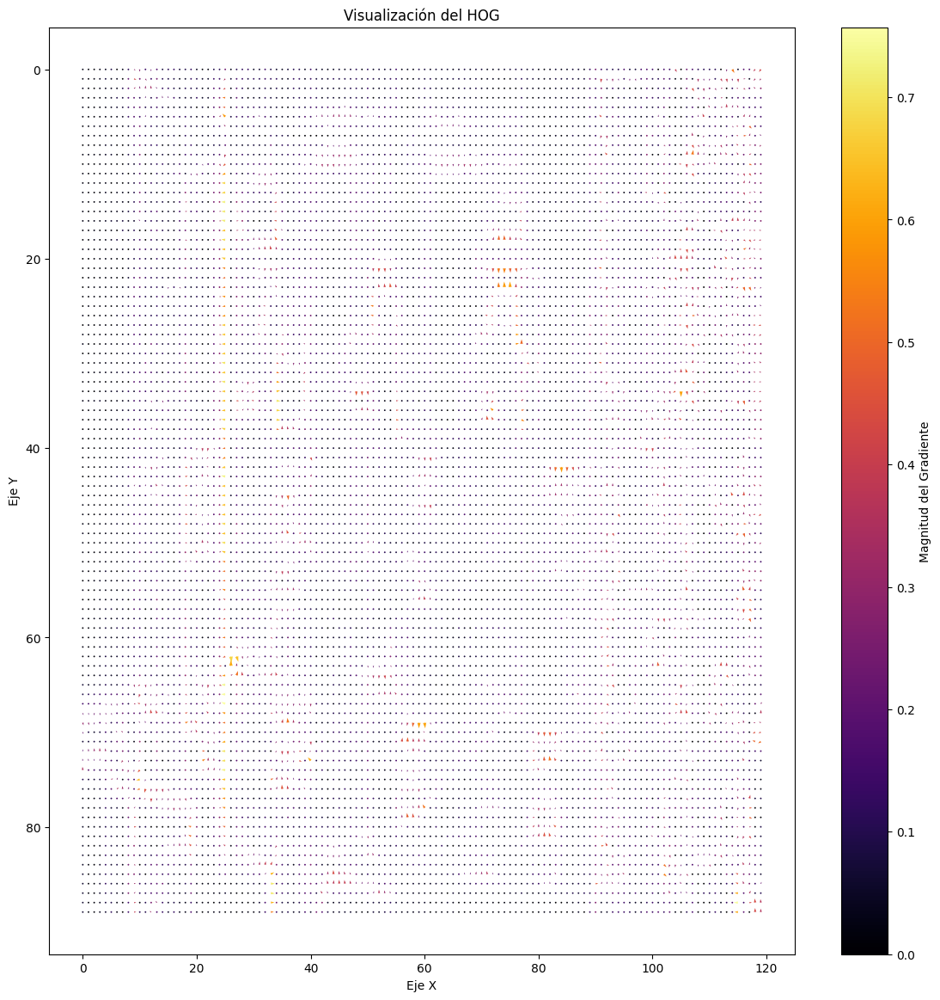

In [93]:
# Impresión de las visualizaciones de los HOG de los dataframes

# Iteración de los primeros 5 Dataframes
for i, (name, df) in enumerate(zip(proc_dataframe_names, Normal_Temp[:5])):

    # Impresión del nombre del DataFrame
    print(f"{i + 1}. Filename: {name}"+ "\n")

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Visualización del HOG del Dataframe
    HOV_df(Grad_Mag[i], Grad_Dir[i], 90, 120, 1)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

### **Entrenamiento Modelo**

#### **Algoritmo**

Para abordar el problema de detección de anomalías en las mediciones de temperatura, se decidió hacer uso del modelo **Isolation Forest** con los valores obtenidos de las magnitudes y direcciones de los gradientes de temperatura obtenidos previamente. Esto es debido a que este modelo permite obtener una métrica base para la detección de valores atípicos, objetivo principal de este proyecto, mediante la forma en la que opera.

El modelo de Bosque de Aislamiento, mejor conocido como **Isolation Forest**, opera detectando directamente las anomalías mediante un proceso iterativo relativamente sencillo:

* Se selecciona una variable (feature) de forma aleatoria.
* El conjunto de datos es dividido aleatoriamente en función de esta variable para obtener dos subconjuntos de estos.
* Los dos pasos anteriores se repiten hasta aislar solo un dato.
* Estos pasos se repiten de forma recursiva.

Este modelo encuentra varias similitudes con el modelo del Bosque Aleatorio, mejor conocido como **Random Forest**, ya que se crea un *bosque* formado por decenas o centenas de árboles, cuyos resultados son combinados para obtener un mejor resultado, lo cual es de enorme ayuda en el contexto general de este proyecto.

Debido a que se cuenta con conjuntos de datos correspondientes a matrices de mediciones de temperatura, más no con una variable temporal, puede ser complicado el buscar encontrar relaciones con algunos otros modelos. Por lo tanto, para empezar el análisis de comportamientos, se eligió este modelo que permite detectar anomalías en las instancias y que brinda un primer punto de partida para la búsqueda del mejor modelo a utilizar para resolver esta problemática.

#### **Características importantes**

Para la implementación de este modelo en el conjunto de datos con el que se cuenta, se ha realizado el análisis correspondiente a la normalización de los datos y el cálculo de los componentes del gradiente de cada uno de los pixeles, los cuales contienen las mediciones de temperatura detectadas por el sensor, por cada uno de los archivos con las mediciones obtenidas.

Estos archivos corresponden a las temperaturas detectadas por el equipo de sensado, una cámara termográfica de la marca Fluke, y que son mostradas en forma de imágenes en la interfaz principal del equipo. Debido a esto, se implementan las técnicas anteriores y siguientes a los archivos obtenidos de las imágenes que fueron utilizadas para el entrenamiento y ejecución del modelo de visión que se pudo apreciar anteriormente en el documento.

In [94]:
# Inicialización de listas para almacenar resultados
Grads_Mag = []
Grads_Dir = []
Grads_DirDeg = []
Grads_Mag_N = []
Grads_Dir_N = []
Grads_DirDeg_N = []
Normal_Temps = []

Inicialmente, se normalizan todos los dataframes obtenidos de la lista de archivos .csv con las mediciones de temperatura.

In [95]:
# Normalización de los Dataframes
for i, (name, df) in enumerate(zip(proc_dataframe_names, processed_dataframes)):

    # Impresión del nombre del DataFrame
    print(f"{i + 1}. Filename: {name}"+ "\n")

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Normalización de Dataframe y almacenamiento en la lista correspondiente
    temp_norm = normalization(df)
    Normal_Temps.append(temp_norm)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

Se truncaron las últimas líneas 5000 del resultado de transmisión.
283. Filename: IR_01570.csv

DataFrame 283:

Dataframe Normalizado:
          1         2         3     4         5         6         7    \
0   0.574468  0.537037  0.537037  0.50  0.555556  0.828571  0.848485   
1   0.574468  0.537037  0.537037  0.56  0.622222  0.828571  0.818182   
2   0.574468  0.537037  0.537037  0.58  0.666667  0.857143  0.818182   
3   0.574468  0.537037  0.555556  0.60  0.733333  0.942857  0.848485   
4   0.574468  0.611111  0.611111  0.68  0.777778  0.971429  0.878788   
..       ...       ...       ...   ...       ...       ...       ...   
85  0.085106  0.055556  0.055556  0.04  0.044444  0.114286  0.121212   
86  0.063830  0.055556  0.037037  0.04  0.044444  0.114286  0.121212   
87  0.063830  0.037037  0.037037  0.02  0.044444  0.114286  0.151515   
88  0.021277  0.018519  0.018519  0.04  0.044444  0.114286  0.151515   
89  0.000000  0.000000  0.018519  0.04  0.044444  0.085714  0.121212   


Estos datos normalizados son utilizados para obtener los cálculos de las componentes de los gradientes de temperatura en las capturas térmicas. No obstante, se obtuvieron los cálculos de estas componentes con ambos tipos de dataframes (normalizados y sin normalizar) para observar las diferencias y verificar que las relaciones se mantengan aún al aplicar técnicas de transformación en los datos.

**Gradientes de Dataframes sin Normalizar**

In [96]:
# Cálculos de Gradientes de los Dataframes
for i, (name, df) in enumerate(zip(proc_dataframe_names, processed_dataframes)):

    # Impresión del nombre del DataFrame
    print(f"{i + 1}. Filename: {name}"+ "\n")

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Operaciones con Gradientes y almacenamiento en la lista correspondiente
    grad_mag, grad_dir, grad_dirdeg = gradient_comps(df)
    Grads_Mag.append(grad_mag)
    Grads_Dir.append(grad_dir)
    Grads_DirDeg.append(grad_dirdeg)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

Se truncaron las últimas líneas 5000 del resultado de transmisión.
 [       -0.3        -0.3        -0.3 ...        -0.2        -0.3        -0.5]
 ...
 [       -0.3        -0.3         0.1 ...           0         0.2         0.1]
 [          0           0           0 ...        -0.1        -0.1         0.4]
 [          0           0           0 ...        -0.1        -0.1         0.4]]

Magnitud del Gradiente por Pixel:
 [[          0         0.1     0.14142 ...     0.31623     0.64031     0.56569]
 [        0.6     0.28284         0.1 ...     0.14142      0.5099     0.53852]
 [        0.5     0.31623     0.42426 ...     0.22361         0.5     0.64031]
 ...
 [        0.3         0.3         0.1 ...         0.3     0.36056     0.31623]
 [          0         0.4         0.1 ...     0.14142     0.41231     0.56569]
 [          0         0.4           0 ...     0.14142     0.14142     0.41231]]

Dirección del Gradiente (radianes) por Pixel:
 [[          0           0      2.3562 ...      

**Gradientes de Dataframes Normalizados**

In [97]:
# Cálculos de Gradientes de los Dataframes
for i, (name, df) in enumerate(zip(proc_dataframe_names, Normal_Temps)):

    # Impresión del nombre del DataFrame
    print(f"{i + 1}. Filename: {name}"+ "\n")

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Operaciones con Gradientes y almacenamiento en la lista correspondiente
    grad_mag, grad_dir, grad_dirdeg = gradient_comps(df)
    Grads_Mag_N.append(grad_mag)
    Grads_Dir_N.append(grad_dir)
    Grads_DirDeg_N.append(grad_dirdeg)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

Se truncaron las últimas líneas 5000 del resultado de transmisión.
 [      -0.12    -0.11111    -0.10714 ...   -0.039216   -0.054545   -0.089286]
 ...
 [      -0.12    -0.11111    0.035714 ...           0    0.036364    0.017857]
 [          0           0           0 ...   -0.019608   -0.018182    0.071429]
 [          0           0           0 ...   -0.019608   -0.018182    0.071429]]

Magnitud del Gradiente por Pixel:
 [[   0.020741    0.026455     0.10668 ...     0.09091     0.11153    0.096315]
 [    0.24089    0.096706    0.071698 ...    0.026261    0.099404     0.10405]
 [    0.22191     0.11363     0.11835 ...     0.04353    0.096987     0.12001]
 ...
 [    0.12033     0.11118    0.078679 ...    0.068806     0.06664     0.05863]
 [          0     0.14286     0.10582 ...    0.037907    0.076541      0.1031]
 [          0     0.14286    0.068783 ...    0.036694    0.023737     0.07304]]

Dirección del Gradiente (radianes) por Pixel:
 [[     3.1416           0      2.8002 ...      

El haber llevado a cabo los cálculos anteriores permite obtener un mejor entendimiento de las fronteras entre los diferentes puntos de la imagen al momento de que existan cambios relevantes de temperatura, en este caso. Al tener un conjunto de datos efectivamente filtrado al trabajar con normalizaciones, el modelo podrá ser ejecutado con una mayor rapidez y eficiencia, además de permitir observar diferentes comportamientos y patrones a lo largo de los conjuntos de datos que se tienen con una mejor efectividad.

#### **Modelo**

Para comenzar con la implementación del modelo de aprendizaje no supervisado, se busca asegurar que las dimensiones de los arreglos que contienen las magnitudes y direcciones de los gradientes (obtenidos con los datos normalizados y no normalizados) sean del mismo tamaño, para no tener errores en la implementación del modelo.

In [98]:
# Asegurado que ambas listas de componentes de los gradientes tienen la misma longitud
assert len(Grads_Mag) == len(Grads_Dir)
assert len(Grads_Mag_N) == len(Grads_Dir_N)

Debido a que se cuenta con varias listas de Dataframes en dos dimensiones, con información diferente correspondiente a un mismo cálculo, se decidió aplanarlos y combinar ambos vectores aplanados por Dataframe para obtener un solo vector con características representativas.

In [99]:
# Inizialización de una lista para almacenamiento de las características
features = []

In [100]:
# Aplanado de los datos y creación de características combinadas

for mag_df, dir_df in zip(Grads_Mag_N, Grads_Dir_N):

    # Aplanado de cada DataFrame de dos dimensiones hacia arreglos de una dimensión
    mag_flat = mag_df.flatten()
    dir_flat = dir_df.flatten()

    # Concatenado de magnitud y dirección aplanada a un vector de características singular
    combined_features = np.hstack((mag_flat, dir_flat))

    # Almacenamiento del vector de características en la lista
    features.append(combined_features)

In [101]:
# Conversión de la lista de características a un arreglo de dos dimensiones (filas = instancias, columnas = características)
features = np.array(features)
print("Forma de la matriz de características:", features.shape)

Forma de la matriz de características: (382, 21600)


La forma de la matriz de características obtenida, corresponde a la siguiente ecuación, considerando **N** Dataframes de forma **(m,n)**:



```
# (N, 2*m*n)
```


Esto es debido a que cada Dataframe contribuye su magnitud y dirección, aplanados en un vector sencillo.

El valor 21600 corresponde 2 veces 10,800, la cual es la cantidad de pixeles en la imagen y cuyas temperaturas son registradas por los archivos .csv.

Una vez que se obtuvo el vector de características, se procede con la implementación del modelo. Debido a que se busca obtener un punto de partida, se decidió llevar a cabo la implementación con solo un par de parámetros seleccionados.

Además de esto, se imprimieron las predicciones obtenidas y los puntajes de las anomalías calculados por el modelo.

In [102]:
# Ejecución del Modelo "Isolation Forest"

from sklearn.ensemble import IsolationForest

# Inicialización y ajustado del modelo
iso_forest = IsolationForest(contamination=0.05, random_state=42)
iso_forest.fit(features)

# Predicción de anomalías (1 = valor típico o "inlier", -1 = valor atípico o "outlier")
predictions = iso_forest.predict(features)

# Obtención de las Métricas de las Anomalías
anomaly_scores = iso_forest.decision_function(features)

# Impresión de los Resultados
print("Predicciones:", predictions)
print("\n")
np.set_printoptions(precision=4, suppress=True)
print(f"Puntuaciones (Scores) de Anomalías: {anomaly_scores}")

Predicciones: [ 1  1  1  1  1  1 -1 -1  1  1  1  1  1  1  1 -1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1 -1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1 -1 -1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  

Para facilitar la visualización de estos resultados, se mapeó cada predicción y su puntaje de anomalía con la instancia a la que corresponden, iniciando en la instancia 0.

In [103]:
# Mapeo de las instancias que corresponden a anomalías
for i, (pred, score) in enumerate(zip(predictions, anomaly_scores)):
  print(f"Instancia {i}: Predicción = {pred}, Puntuación de Anomalía = {np.array2string(np.array([score]), precision=4, suppress_small=True)}")

Instancia 0: Predicción = 1, Puntuación de Anomalía = [0.0181]
Instancia 1: Predicción = 1, Puntuación de Anomalía = [0.0133]
Instancia 2: Predicción = 1, Puntuación de Anomalía = [0.01]
Instancia 3: Predicción = 1, Puntuación de Anomalía = [0.0241]
Instancia 4: Predicción = 1, Puntuación de Anomalía = [0.0108]
Instancia 5: Predicción = 1, Puntuación de Anomalía = [0.0099]
Instancia 6: Predicción = -1, Puntuación de Anomalía = [-0.0127]
Instancia 7: Predicción = -1, Puntuación de Anomalía = [-0.0069]
Instancia 8: Predicción = 1, Puntuación de Anomalía = [0.0126]
Instancia 9: Predicción = 1, Puntuación de Anomalía = [0.024]
Instancia 10: Predicción = 1, Puntuación de Anomalía = [0.0045]
Instancia 11: Predicción = 1, Puntuación de Anomalía = [0.0369]
Instancia 12: Predicción = 1, Puntuación de Anomalía = [0.0062]
Instancia 13: Predicción = 1, Puntuación de Anomalía = [0.0264]
Instancia 14: Predicción = 1, Puntuación de Anomalía = [0.0193]
Instancia 15: Predicción = -1, Puntuación de Anom

Además de lo anterior, se imprimen las predicciones que fueron detectadas como anomalías y se visualizan los cálculos de gradientes de cada una de las instancias a las que corresponden. Esto se lleva a cabo para poder visualizar las zonas en las que fueron detectados los puntos con valores atípicos en el conjunto de todos los posibles datos.

In [104]:
# Impresión de las predicciones detectadas como anomalías
outlier_indices = [i for i, p in enumerate(predictions) if p == -1]
print("Instancias de Anomalías:", outlier_indices)

Instancias de Anomalías: [6, 7, 15, 19, 62, 77, 80, 92, 108, 109, 141, 151, 162, 163, 164, 183, 195, 245, 288, 359]


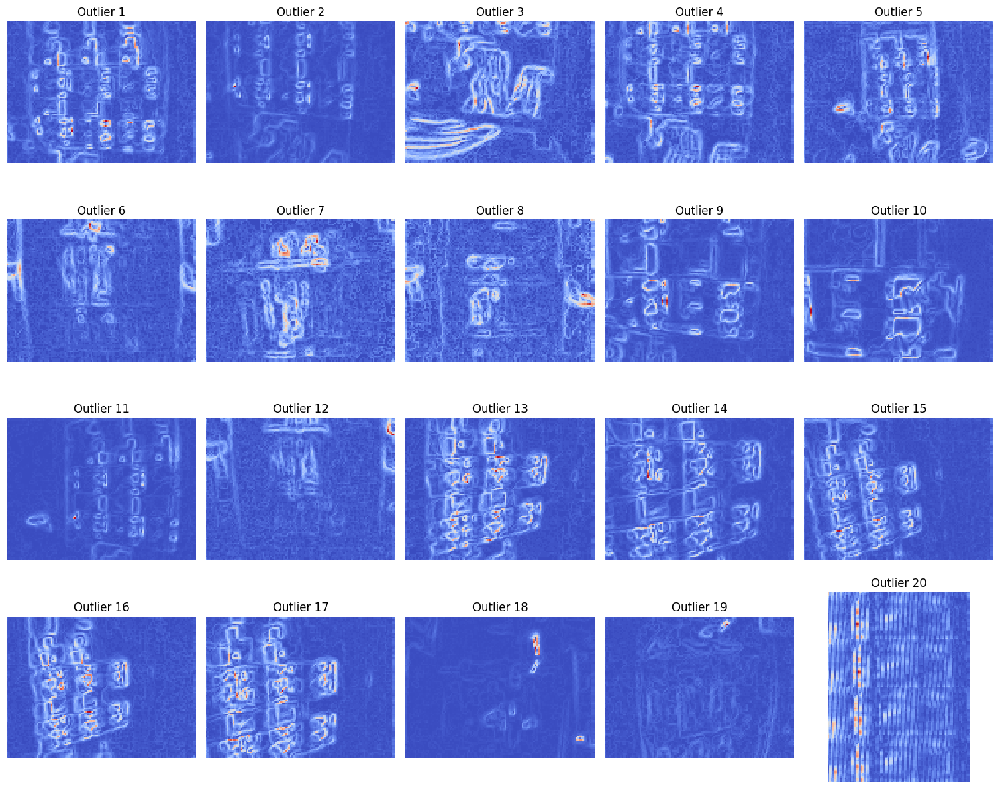

In [105]:
# Visualización de los Dataframes anómalos con los Dataframes sin Normalizar

# Seteo del número de columnas por fila (5 gráficos por fila)
cols = 5

# Número de Valores Atípicos Totales
num_outliers = len(outlier_indices)

# Cálculo del número de filas requeridas
rows = (num_outliers + cols - 1) // cols

# Creación de la figura y sus ejes
fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))  # Ajuste de la altura de la fila

# Aplanado de los ejes para facilitar las iteraciones
axes = axes.flatten()

# Graficado de cada valor atípico en su subgráfica correspondiente
for i, ax in enumerate(axes):
    if i < num_outliers:
        outlier_mag = Grads_Mag[outlier_indices[i]]  # Selección de los datos atípicos
        ax.imshow(outlier_mag, cmap='coolwarm', interpolation='none')
        ax.set_title(f'Outlier {i+1}')
    else:
        ax.axis('off')  # Escondido de subgráficos vacíos si no hay suficientes valores atípicos

    ax.axis('off')  # Escondido de los ticks de los ejes

plt.tight_layout()  # Ajuste del layout para prevenir superposición
plt.show()

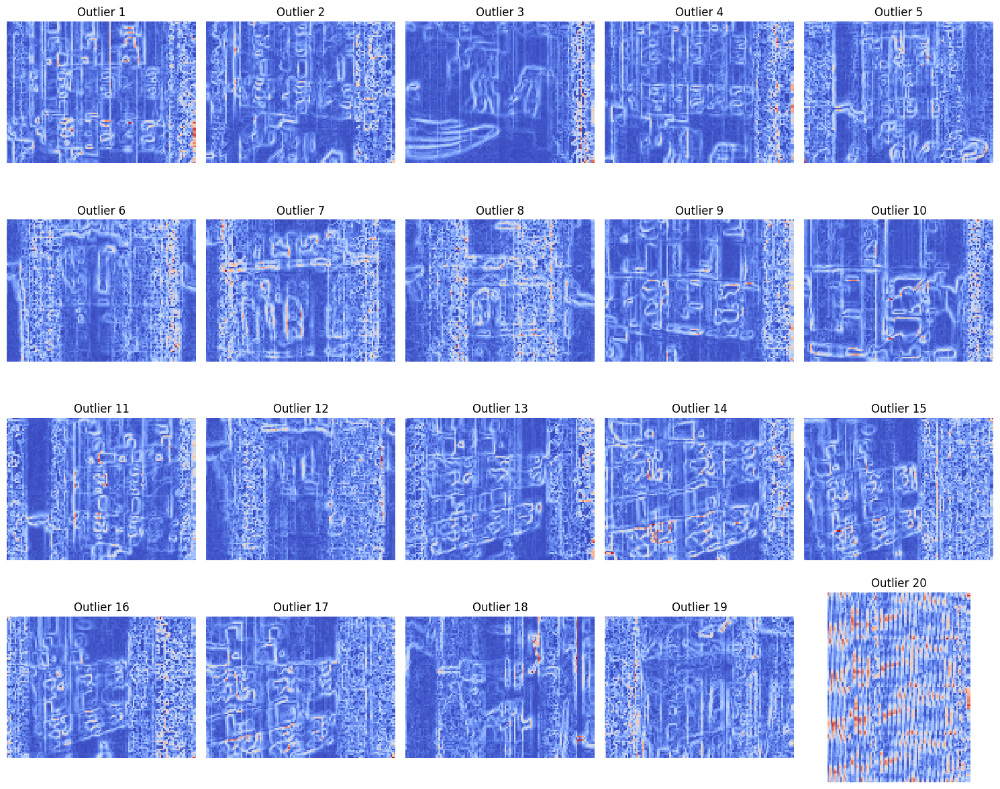

In [106]:
# Visualización de los Dataframes anómalos con los Dataframes Normalizados

# Seteo del número de columnas por fila (5 gráficos por fila)
cols = 5

# Número de Valores Atípicos Totales
num_outliers = len(outlier_indices)

# Cálculo del número de filas requeridas
rows = (num_outliers + cols - 1) // cols

# Creación de la figura y sus ejes
fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))  # Ajuste de la altura de la fila

# Aplanado de los ejes para facilitar las iteraciones
axes = axes.flatten()

# Graficado de cada valor atípico en su subgráfica correspondiente
for i, ax in enumerate(axes):
    if i < num_outliers:
        outlier_mag = Grads_Mag_N[outlier_indices[i]]  # Selección de los datos atípicos
        ax.imshow(outlier_mag, cmap='coolwarm', interpolation='none')
        ax.set_title(f'Outlier {i+1}')
    else:
        ax.axis('off')  # Escondido de subgráficos vacíos si no hay suficientes valores atípicos

    ax.axis('off')  # Escondido de los ticks de los ejes

plt.tight_layout()  # Ajuste del layout para prevenir superposición
plt.show()

Como se puede observar al visualizar las imágenes haciendo uso de los gradientes calculados, se encuentran varias distinciones interesantes. 

En primer lugar, se puede apreciar que al hacer uso de los datos de gradientes normalizados, la resolución de la imagen al intentar ser reconstruida se pierde en gran medida. Esto puede deberse a diferentes razones, siendo una de estas que los datos no mantienen sus pesos y relaciones originales, por lo que la escala de colores no puede acomodar o mostrar las diferentes zonas con mejor exactitud.

No obstante, al graficar los gradientes sin los datos normalizados, se puede encontrar una mejor resolución de la imagen y la detección de los puntos atípicos que el modelo encontró.

#### **Sub/sobreajuste**


Para detectar si un modelo de aprendizaje no supervisado como **Isolation Forest** se encuentra subentrenado o sobreentrenado, se pueden llevar a cabo diferentes procesos. Se ha elegido graficar la distribución de las puntuaciones de anomalías en un histograma, además de un gráfico de cajas, para poder observar el cómo es que el modelo separa los valores típicos ("inliers") y los valores atípicos ("outliers").

Lo que se busca obtener en estas visualizaciones es una separación clara del threshold de decisión (típicamente siendo éste 0). Es decir, este threshold debería separar claramente los valores típicos y los atípicos, con los valores típicos estando en un rango de valores positivos o cercanos a cero, mientras que los atípicos tendrán puntuaciones negativas. 

En caso de que muchas puntuaciones se encuentren cerca de cero, esto puede indicar que el modelo está sobreentrenado, siendo muy estricto con desviaciones menores y tratándolas como atípicos. En caso de que se termine mostrando un amplio rango de puntuaciones a través del gráfico, pudiera significar que el modelo está subentrenado al no estar aprendiendo patrones concretos y asignando mismas puntuaciones a valores típicos y atípicos.

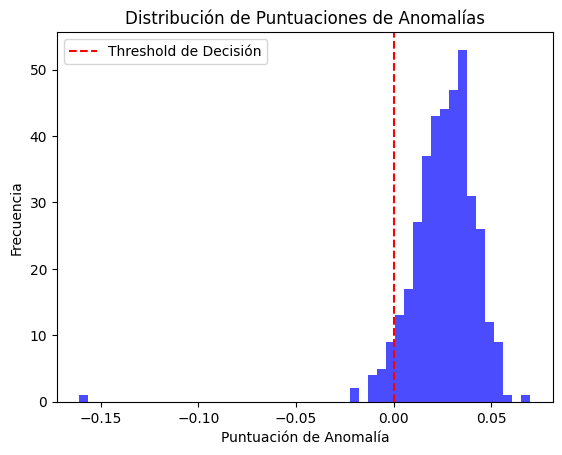

In [107]:
# Graficado de la distribución de las puntuaciones de anomalías
plt.hist(anomaly_scores, bins=50, alpha=0.7, color='blue')
plt.title("Distribución de Puntuaciones de Anomalías")
plt.xlabel("Puntuación de Anomalía")
plt.ylabel("Frecuencia")
plt.axvline(x=0, color='red', linestyle='--', label='Threshold de Decisión')
plt.legend()
plt.show()

Por lo que se puede observar en este gráfico, pareciera indicar que el modelo pudiera estar un poco sobreentrenado. Esto puede ser solucionado o minimizado al reducir la cantidad de estimadores utilizados (la complejidad del modelo), aumentar el parámetro de contaminación o incrementar la cantidad de muestras para obtener una mejor generalización. 

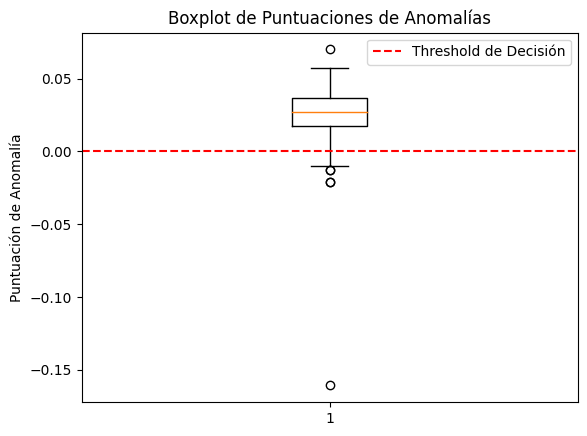

In [108]:
# Boxplot para visualizar las puntuaciones de anomalías
plt.boxplot(anomaly_scores)
plt.title("Boxplot de Puntuaciones de Anomalías")
plt.ylabel("Puntuación de Anomalía")
plt.axhline(y=0, color='red', linestyle='--', label='Threshold de Decisión')
plt.legend()
plt.show()

Este gráfico de caja indica que si se enocntraron algunas anomalías, no obstante, el tema de sobreentrenamiento puede tener bastante que ver en la forma en la que se distribuyen estos valores.

#### **Métrica**

A continuación se muestran diferentes métricas obtenidas para el observar diferentes características del modelo y su ejecución.

Estas métricas son:
* Validación cruzada con una función personalizada de puntaje
* Cálculo del puntaje de silueta
* Relación de valores atípicos obtenidos
* Visualización de típicos y atípicos



El cálculo de la validación cruzada haciendo uso de una función personalizada de puntaje, al no contar con etiquetas de las salidas ya que se hace uso de un modelo de aprendizaje no supervisado, es utilizado para evaluar la estabilidad del modelo a través de diferentes particiones de los datos.

Es decir, si se mantiene una estabilidad relativamente similar y, por consecuencia, una varianza baja, se puede considerar que el modelo está trabajando de buena forma y no se encuentra subentrenado o sobreentrenado.

In [109]:
# Validación cruzada del modelo

# Definición de una función personalizada de puntaje usando solo los datos en X
def mean_anomaly_score(estimator, X):
    scores = estimator.decision_function(X)  # Mayores puntajes, significan mayor normal
    return np.mean(scores)

# Creación del modelo IsolationForest para validación cruzada
iso_forest_cv = IsolationForest(contamination=0.05, random_state=42)

# Implementación de validación cruzada usando KFold porque y_true no se necesita en este caso
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Acumulado de puntuaciones a través de las particiones
cv_scores = []

for train_idx, test_idx in kf.split(features):
    iso_forest_cv.fit(features[train_idx])  # Entrenamiento en la partición de entrenamiento
    score = mean_anomaly_score(iso_forest_cv, features[test_idx])  # Puntaje en la partición de prueba
    cv_scores.append(score)

print(f'Puntuaciones de Anomalías de Validación Cruzada: {cv_scores}')
print(f'Puntuación de Anomalías Promedio (CV): {np.mean(cv_scores)}')

Puntuaciones de Anomalías de Validación Cruzada: [0.016700009043890206, 0.022398231864739028, 0.02180957177044478, 0.022099930451926937, 0.01647229178241116]
Puntuación de Anomalías Promedio (CV): 0.019896006982682422


Además de la métrica anterior, se lleva a cabo el cálculo de la puntuación de la silueta. Esto sirve para medir las separaciones (como agrupamientos) entre los valores típicos y atípicos. Un puntaje cercano a 0 o negativo, indica una separación pobre o bordes poco claros, mientras que valores mayores a 0.5 indican por lo general, una buena separación entre ambos grupos.

In [110]:
# Mapeo de predicciones a 1 para valor típico o "inlier" y -1 para valor atípico o "outlier"
predictions_mapped = [1 if pred == 1 else -1 for pred in predictions]

# Cálculo de la puntuación de silueta (valores más altos, indican un mejor agrupamiento)
sil_score = silhouette_score(features, predictions_mapped)
print(f"Silhouette Score: {sil_score:.2f}")

Silhouette Score: 0.01


La relación o proporción de valores atípicos permite observar si el modelo se encuentra comportándose de la manera esperada. Si la relación obtenida tiene mucha desviación, pudiera significar un sobreentrenamiento (muchos valores atípicos) o un subentrenamiento (pocos valores atípicos).

In [111]:
# Cálculo de la Relación de Valores Atípicos
outlier_ratio = (predictions == -1).sum() / len(predictions)

# Impresión de Resultados
print(f'Relación de Valores Atípicos: {outlier_ratio:.2%}, Esperados: {iso_forest.contamination * 100:.2f}%')

Relación de Valores Atípicos: 5.24%, Esperados: 5.00%


Por último, una visualización entre la reconstrucción de las imágenes de un conjunto con valor atípico o anómalo detectado, permite una interpretación para el usuario un poco más intuitiva a comparación de valores numéricos.

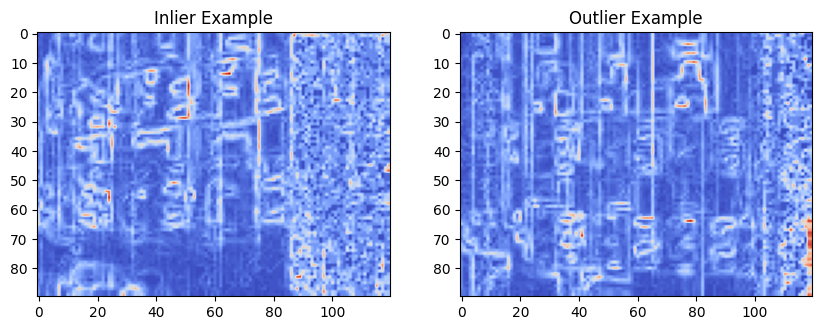

In [112]:
# Visualización de atípicos contra típicos para comparar formas y patrones

# Definición de características de la figura
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Visualización de un valor típico o "inlier"
axes[0].imshow(Grads_Mag_N[0], cmap='coolwarm')
axes[0].set_title('Inlier Example')

# Visualización de un valor atípico o "outlier"
axes[1].imshow(Grads_Mag_N[outlier_indices[0]], cmap='coolwarm')
axes[1].set_title('Outlier Example')

# Impresión del gráfico
plt.show()

Para este proyecto, habiendo obtenido diferentes valores en las métricas mencionadas anteriormente, se eligieron la validación cruzada con un puntaje personalizado y el cálculo de la proporción de los valores atípicos. Esto es debido a que la validación cruzada permite observar si la estabilidad del modelo se está manteniendo al realizar particiones sobre los datos, además de permitir obtener diferentes resultados que ayuden a detectar si el modelo se encuentra operando de buena o mala forma.

Además de ello, el cálculo de la proporción, permite visualizar si el parámetro de contaminación en el modelo se encuentra operando de forma correcta o si el modelo no lo está tomando en cuenta y no se encuentra operando de buena forma. 

No se toma en cuenta el cálculo de silueta ni la visualización de las predicciones, debido a que el primero no es una métrica estándar y puede mostrar información que puede ser malinterpretada mientras que el segundo no es algo que pueda ser usado de forma tan sencilla en conjuntos de datos más grandes. 

Además de esto, se buscará implementar el cálculo del recall y de la precisión en el modelo, para obtener una mejor visualización sobre su comportamiento.

#### **Desempeño**

Para establecer un desempeño mínimo en el modelo de detección de anomalías, se busca setear intencionalmente un threshold bastante alto para las puntuaciones de anomalías obtenidas por el modelo. Esto permite clasificar muy pocos puntos como valores atípicos, normalmente resultando en valores de recall bajos pero una precisión bastante alta. Además de esto, se debe buscar que el modelo no cuente con desviaciones muy grandes en la proporción de valores atípicos calculados contra los definidos y que no pierda estabilidad al buscar ejecutarlo sobre diferentes particiones de datos.

En nuestro caso, establecemos como criterio que el modelo debe alcanzar una precisión mayor al 80% con respecto a la detección de valores atípicos, debido a que esto es crucial al momento de estar detectando el comportamiento de diferentes componentes de un solo equipo al encontrarse en operación. Se buscará que, en conjunto con lo anteriormente mencionado, el modelo pueda clasificar correctamente las imágenes o conjuntos de mediciones de temperatura que cuentan con valores atípicos detectados, al modificar los parámetros de operación del modelo para mejorar la forma en la que éste actua sobre los datos y obtener resultados lo más acertados posibles.

Debido a los resultados obtenidos con este modelo base, se concluye que falta optimizar la selección de parámetros para la ejecución del modelo, debido al comportamiento de sobreentrenamiento observado, por lo cual no se cumple con el desempeño deseado por el momento.